# My social network - Katarina Kučuk

In [1]:
import networkx as nx

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.cm as cm

import numpy as np
import pandas as pd
import seaborn as sns

from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import AgglomerativeClustering

import scipy
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform
from scipy.sparse.csgraph import reverse_cuthill_mckee
from scipy.sparse import csr_matrix

from collections import Counter
from typing import Dict, List
import random

import vk_api

## Network Summary

### Network source - VK

In [2]:
vk_session = vk_api.VkApi('email', 'password')
vk_session.auth()

vk = vk_session.get_api()

In [3]:
friends_ids = vk.friends.get()['items']

In [4]:
print('I have {} friends on VKontakte.'.format(len(friends_ids)))

I have 24 friends on VKontakte.


I first tried to use my data from the Russian social network VKontakte, but since it is not popular in Serbia, I have only 24 connections there - mostly people I met when I was in the camp in Saint Petersburg five years ago. 

Because of the small number of nodes I have in the network in VK, I decided to use my Facebook profile that I have for more than 10 years and where I am connected to most of my friends.

My VK profile can be found on the following link: https://vk.com/katkucuk

### Network source - Facebook

Unfortunately, due to the new Facebook regulations, I could not find an efficient way to get my network data. Because of that, I decided to make two txt files - one that includes all my friends, some general attributes you can find on their Facebook profiles (name and surname, gender, hometown, level of education) and the other one with all mutual friends between me and them.

My Facebook profile can be found on the following link: https://www.facebook.com/katarina.kucuk/

In [5]:
friends_url = 'https://raw.githubusercontent.com/Kale2601/SocialNetwork/main/friends%20modified.txt'
connections_url = 'https://raw.githubusercontent.com/Kale2601/SocialNetwork/main/connections.txt'

In [6]:
friends = pd.read_csv(friends_url)
connections = pd.read_csv(connections_url)

In [7]:
def friends_graph(friends, connections):
    
    graph = nx.Graph()

    friends_nodes = friends['id'].tolist()
    connections_edges = zip(connections['id_from'], connections['id_to'])
    
    graph.add_nodes_from(friends_nodes)
    graph.add_edges_from(connections_edges)

    nx.set_node_attributes(graph, friends['id'].to_dict(), 'id')
    nx.set_node_attributes(graph, friends['name_and_surname'].to_dict(), 'name_and_surname')
    nx.set_node_attributes(graph, friends['gender'].to_dict(), 'gender')
    nx.set_node_attributes(graph, friends['relation'].to_dict(), 'relation')
    nx.set_node_attributes(graph, friends['hometown'].to_dict(), 'hometown')
    nx.set_node_attributes(graph, friends['education_level'].to_dict(), 'education_level')

    return graph

In [8]:
G = friends_graph(friends, connections)

### Size, Order

In [9]:
print('I have {} friends in my Facebook network and there are {} connections between them. Also, my network consists of {} connected components.'.format(G.number_of_nodes(), G.number_of_edges(), nx.number_connected_components(G)))


I have 333 friends in my Facebook network and there are 3085 connections between them. Also, my network consists of 24 connected components.


### Node / Edge attributes

In [10]:
friends.head(10)

,id,name_and_surname,gender,relation,hometown,education_level
0,0,Ana Marija Gjurcinova,f,3,Skopje,2
1,1,Sofija Todoric,f,3,Belgrade,2
2,2,Dina Boskovic,f,6,Belgrade,2
3,3,Nadja Velickovic,f,4,Belgrade,1
4,4,Sonja Vukotic,f,4,Belgrade,2
5,5,Emir Custovic,m,1,Belgrade,1
6,6,Nadja Maletic,f,4,Belgrade,2
7,7,Ana Legeza,f,1,Belgrade,2
8,8,Visnja Kasagic,f,6,Gradiska,1
9,9,Katarina Antonic,f,4,Belgrade,2


My nodes have 6 attributes:


1.   ID
2.   Name and surname
3.   Gender (m - male, f - female)
4.   Relation 
5.   Hometown 
6.   Education level (0 - other or not specified, 1 - high school, 2 - university)

Since I know all people in my Facebook network, attribute relation is something I added based on the source of connection between me and each node. I had planned to use it for comparing with the results I will get after community detection. This attribute is coded in the following manner:


0.   People I met while I was a part of a Formula Student Team Road Arrow
1.   My friends from primary school
2.   My friends from high school
3.   My friends from the university
4.   My teammates and other people I met while I was training swimming
5.   People I met when I attended Ecological Camp near Saint Petersburg, Russia in 2016
6.   Other



### Gorgeous network layouts

In [11]:
degree_sequence = [d for n, d in G.degree()]

Text(0.5, 1.0, 'My Facebook network')

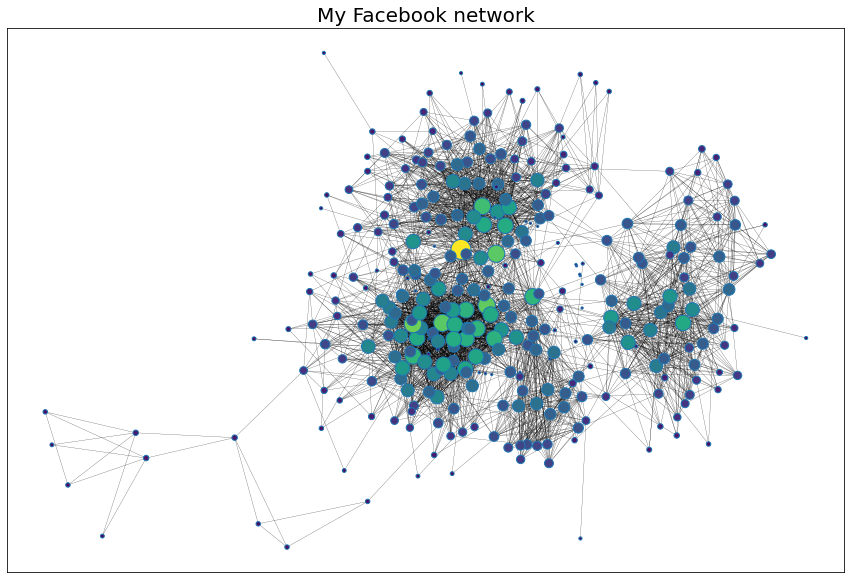

In [12]:
plt.figure(figsize = (15, 10))

nx.draw_networkx(G,
                 pos = nx.kamada_kawai_layout(G), 
                 width = 0.2,
                 node_size = [(val + 1) * 5 for val in degree_sequence],
                 node_color = degree_sequence,
                 edgecolors = 'tab:blue',
                 with_labels = False)
plt.title('My Facebook network', fontsize = 20)

Text(0.5, 1.0, 'My Facebook network - spiral layout')

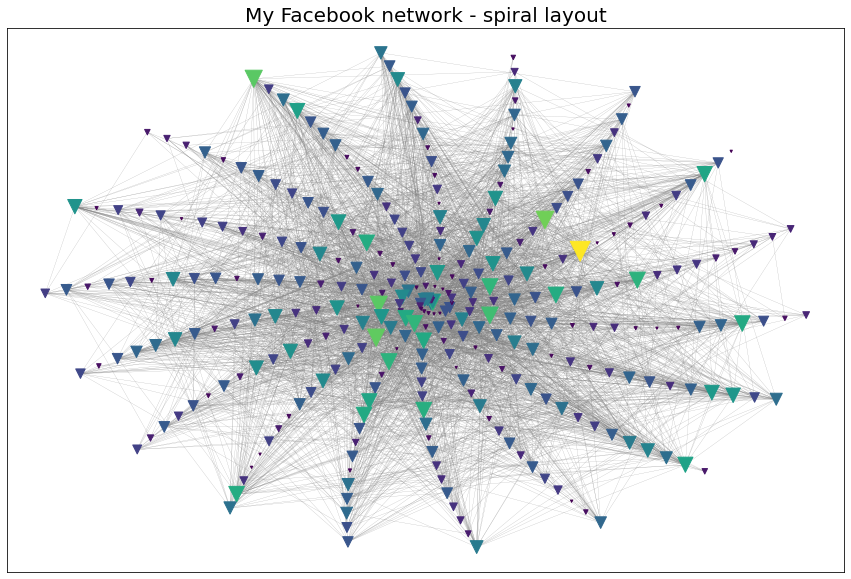

In [13]:
plt.figure(figsize = (15, 10))

nx.draw_networkx(G,
                 pos = nx.spiral_layout(G), 
                 width = 0.15,
                 node_size = [(val + 1) * 5 for val in degree_sequence],
                 node_color = degree_sequence,
                 node_shape = 'v',
                 edge_color = 'gray', 
                 with_labels = False)
plt.title('My Facebook network - spiral layout', fontsize = 20)

Maybe previous graph does not say too much about the structure of my network, or communities in it for example, but it it indeed gorgeous.

Both size and color in the previous graphs depend on node degrees - the higher the node degree value is, the bigger node and lighter the color is.

#### Gender

In [14]:
f = 0
gender = nx.get_node_attributes(G, 'gender')

for g in list(gender.values()):
  if g == 'f':
    f += 1

print('In my network I have {} female friends and {} male friends.'.format(f, len(G.nodes) - f))

In my network I have 203 female friends and 130 male friends.


In [15]:
genders_color = {
    'f': 'pink',
    'm': 'blue'
}

In [16]:
def gender_color(G: nx.Graph, relations_color: Dict[str, str] = genders_color) -> Dict[int, str]:

    genders = nx.get_node_attributes(G, 'gender')
    colors = {color: genders_color[genders[color]] for color in genders}

    return colors

In [17]:
nx.set_node_attributes(G, gender_color(G), 'gender_color')

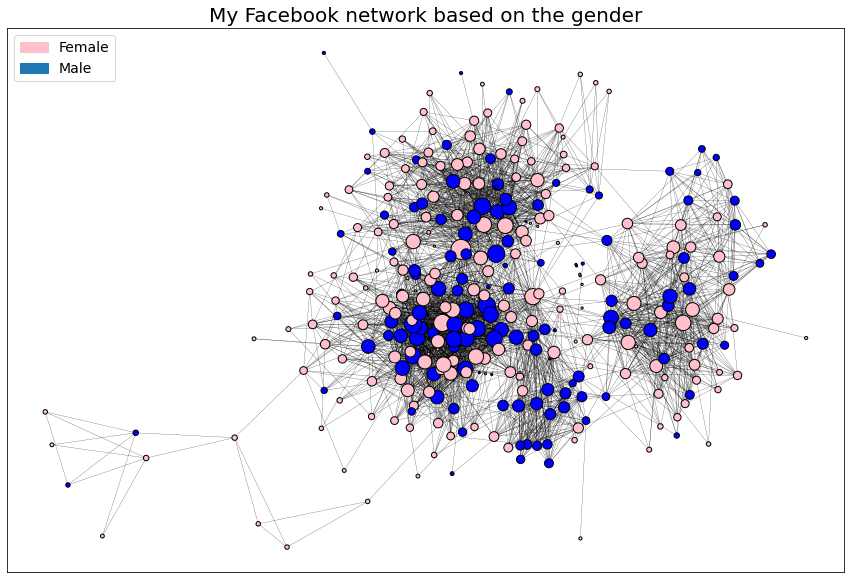

In [18]:
plt.figure(figsize = (15, 10))
nx.draw_networkx_nodes(G,
                       pos = nx.kamada_kawai_layout(G), 
                       node_size = [(val + 1) * 5 for val in degree_sequence],
                       node_color = list(nx.get_node_attributes(G, 'gender_color').values()),
                       edgecolors = 'black')
nx.draw_networkx_edges(G,
                       pos = nx.kamada_kawai_layout(G),
                       width = 0.2)

pink_patch = mpatches.Patch(color = 'pink', label = 'Female')
blue_patch = mpatches.Patch(color = 'tab:blue', label = 'Male')

plt.title('My Facebook network based on the gender', fontsize = 20)
plt.legend(handles = [pink_patch, blue_patch], loc = 'upper left', fontsize = 14)
plt.show()

#### Hometown

In [19]:
bel = 0
hometown = nx.get_node_attributes(G, 'hometown')

for h in list(hometown.values()):
  if h == 'Belgrade':
    bel += 1

print('In my network I have {} friends from my hometown - Belgrade, Serbia and {} friends from other towns or cities.'.format(bel, len(G.nodes) - bel))

In my network I have 178 friends from my hometown - Belgrade, Serbia and 155 friends from other towns or cities.


In [20]:
hometown_counter = dict(Counter(hometown.values()))

print('Hometown : number of people in network')
print('---------------------------------------')
for k in sorted(hometown_counter, key = hometown_counter.get, reverse = True):
    print('{} : {}'.format(k, hometown_counter[k])) 

Hometown : number of people in network
---------------------------------------
Belgrade : 178
Not specified : 29
Gradiska : 7
Skopje : 6
Saint Petersburg : 6
Kragujevac : 4
Jagodina : 4
Leskovac : 4
Sombor : 4
Vrsac : 3
Moscow : 3
Uzice : 3
Valjevo : 3
Banja Luka : 3
Pancevo : 3
Svilajnac : 3
Nis : 2
Komarno : 2
Smederevo : 2
Kraljevo : 2
Novi Sad : 2
Krusevac : 2
Trebinje : 1
Homs : 1
Aleksandrovac : 1
Prijepolje : 1
Tashkent : 1
Herceg Novi : 1
Vrbas : 1
Perlez : 1
Zadar : 1
Sertolovo : 1
Eket : 1
Vranje : 1
Ljig : 1
Angarsk : 1
Gornji Milanovac : 1
Indjija : 1
Danilovgrad : 1
Zrenjanin : 1
Chanhassen : 1
Surabaya : 1
Pristina : 1
Prizren : 1
Prilep : 1
Monserrat : 1
Varese : 1
Prato : 1
Toulon : 1
Atambua : 1
Bajina Basta : 1
Majdanpek : 1
Zaraysk : 1
Tbilisi : 1
Banatsko Novo Selo : 1
Naryan-Mar : 1
Chelyabinsk : 1
Paracin : 1
Bela Crkva : 1
Novi Becej : 1
Lille : 1
Jasenovo : 1
Sabac : 1
Brcko : 1
Ciudad Real : 1
Bangalore : 1
Murmansk : 1
Zvornik : 1
Irun : 1
Bratunac : 1
Pudarci

Since Belgrade, where I was born and grew up, is the capital of Serbia and also the biggest city in my country, the high number of people in my network that are also from Belgrade is not surprising. 

Besides that, an interesting result is that there are seven people from Gradiska in my network. It is a small town in Bosnia and Hercegovina where my father was born and grew up, so those nodes mostly represent my cousins from there.  

In [21]:
hometowns_color = {}

for v in hometown.values():
  if v == 'Belgrade':
      hometowns_color[v] = 'gray'
  elif v == 'Not specified':
      hometowns_color[v] = 'blue'
  elif v == 'Gradiska':
      hometowns_color[v] = 'red'
  elif v == 'Saint Petersburg':
      hometowns_color[v] = 'green'
  elif v == 'Skopje':
      hometowns_color[v] = 'purple'
  else:
      hometowns_color[v] = 'orange'

In [22]:
def hometown_color(G: nx.Graph, hometown_color: Dict[str, str] = hometowns_color) -> Dict[int, str]:

    hometowns = nx.get_node_attributes(G, 'hometown')
    colors = {color: hometowns_color[hometowns[color]] for color in hometowns}

    return colors

In [23]:
nx.set_node_attributes(G, hometown_color(G), 'hometown_color')

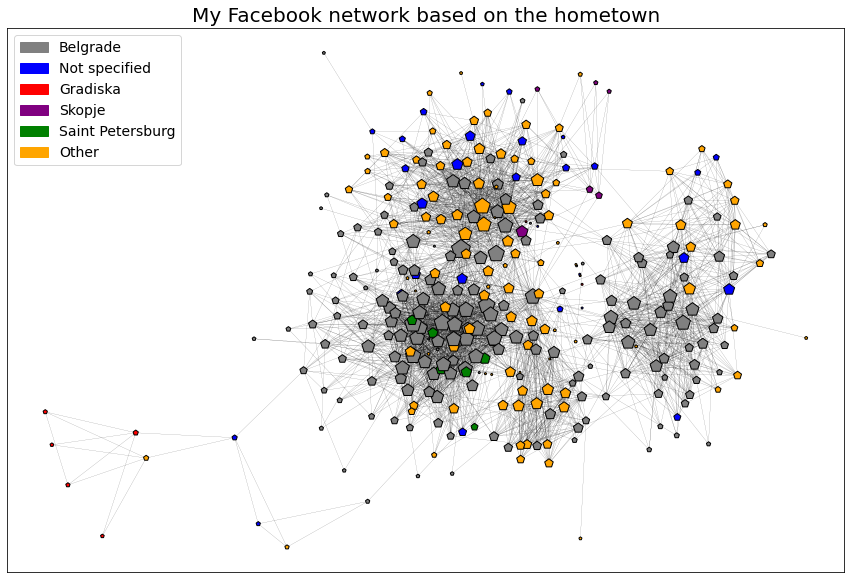

In [24]:
plt.figure(figsize = (15, 10))
nx.draw_networkx(G,
                 pos = nx.kamada_kawai_layout(G), 
                 width = 0.1,
                 node_size = [(val + 1) * 5 for val in degree_sequence],
                 node_color = list(nx.get_node_attributes(G, 'hometown_color').values()),
                 edgecolors = 'black',
                 node_shape = 'p',
                 with_labels = False)

gray_patch = mpatches.Patch(color = 'gray', label = 'Belgrade')
blue_patch = mpatches.Patch(color = 'blue', label = 'Not specified')
red_patch = mpatches.Patch(color = 'red', label = 'Gradiska')
purple_patch = mpatches.Patch(color = 'purple', label = 'Skopje')
green_patch = mpatches.Patch(color = 'green', label = 'Saint Petersburg')
orange_patch = mpatches.Patch(color = 'orange', label = 'Other')

plt.title('My Facebook network based on the hometown', fontsize = 20)
plt.legend(handles = [gray_patch, blue_patch, red_patch, purple_patch, green_patch, orange_patch], loc = 'upper left', fontsize = 14)
plt.show()

#### Relations

In [25]:
relations_color = {
    0: 'gray',
    1: 'tab:red',
    2: 'yellow',
    3: 'tab:orange',
    4: 'tab:blue',
    5: 'tab:green', 
    6: 'tab:purple'
}

In [26]:
def relation_color(G: nx.Graph, relations_color: Dict[int, str] = relations_color) -> Dict[int, str]:

    relations = nx.get_node_attributes(G, 'relation')
    colors = {color: relations_color[relations[color]] for color in relations}

    return colors

In [27]:
nx.set_node_attributes(G, relation_color(G), 'relation_color')

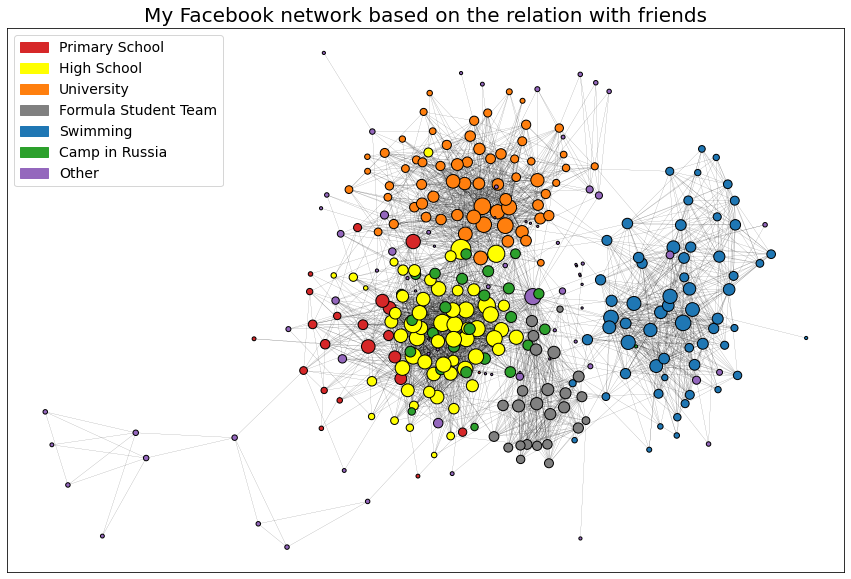

In [28]:
plt.figure(figsize = (15, 10))
nx.draw_networkx(G,
                 pos = nx.kamada_kawai_layout(G), 
                 width = 0.1,
                 node_size = [(val + 1) * 5 for val in degree_sequence],
                 node_color = list(nx.get_node_attributes(G, 'relation_color').values()),
                 edgecolors = 'black',
                 with_labels = False)

red_patch = mpatches.Patch(color = 'tab:red', label = 'Primary School')
yellow_patch = mpatches.Patch(color = 'yellow', label = 'High School')
orange_patch = mpatches.Patch(color = 'tab:orange', label = 'University')
gray_patch = mpatches.Patch(color = 'gray', label = 'Formula Student Team')
blue_patch = mpatches.Patch(color = 'tab:blue', label = 'Swimming')
green_patch = mpatches.Patch(color = 'tab:green', label = 'Camp in Russia')
purple_patch = mpatches.Patch(color = 'tab:purple', label = 'Other')

plt.title('My Facebook network based on the relation with friends', fontsize = 20)
plt.legend(handles = [red_patch, yellow_patch, orange_patch, gray_patch, blue_patch, green_patch, purple_patch], loc = 'upper left', fontsize = 14)
plt.show()

Here is how my network communities would look like based on the pre-knowledge I used while creating a dataset.

### Connected components

In [29]:
connected_components = sorted(list(nx.connected_components(G)), key = len, reverse = True)

In [30]:
biggest_cc = G.subgraph(connected_components[0])
deg_sequence_cc = [d for n, d in biggest_cc.degree()]

In [31]:
print('In my node there are {} connected components. The biggest one has {} nodes.'.format(len(connected_components), len(biggest_cc)))

In my node there are 24 connected components. The biggest one has 277 nodes.


Text(0.5, 1.0, 'The biggest connected component in my network')

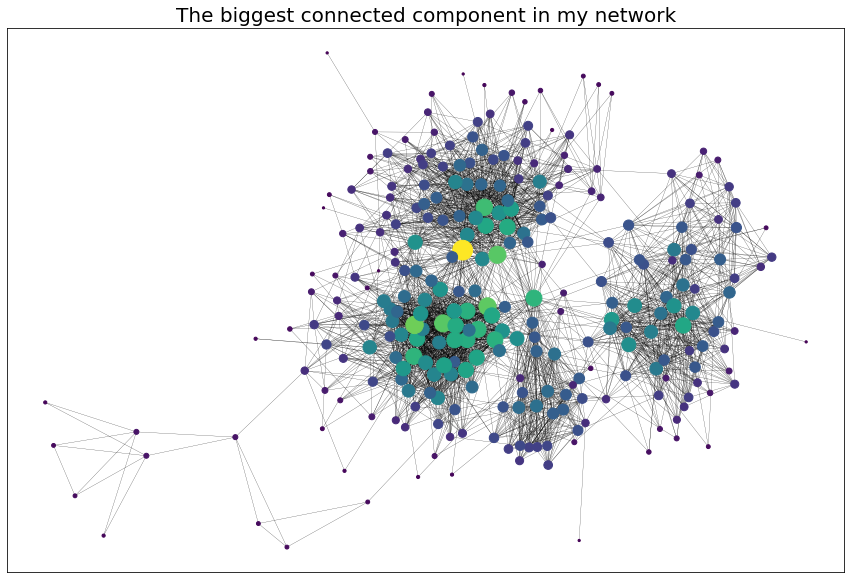

In [32]:
plt.figure(figsize = (15, 10))

nx.draw_networkx(biggest_cc,
                 pos = nx.kamada_kawai_layout(biggest_cc), 
                 width = 0.2,
                 node_size = [val * 5 for val in deg_sequence_cc],
                 node_color = deg_sequence_cc,
                 with_labels = False)
plt.title('The biggest connected component in my network', fontsize = 20)

Both size and color in the previous graph depend on node degrees - the higher the node degree value is, the bigger node and lighter the color is. 

### Diameter, Radius

In [33]:
diameter = nx.diameter(biggest_cc)
radius = nx.radius(biggest_cc)

print('Diameter of the biggest connected component: ', diameter)
print('Radius of the biggest connected component: ', radius)

Diameter of the biggest connected component:  8
Radius of the biggest connected component:  4


### Clustering Coefficient (global, average local, histogram of locals)

In [34]:
average_clustering = nx.average_clustering(G)
print('Average clustering coefficient of the whole network: ', round(average_clustering, 4))
print('-------------------------------------------------------------')
print('')
print('Average clustering coefficient for each component: ')
print('')
i = 1
average_clustering_coefficients_cc = []
for connected_component in connected_components:
  print('Component {} - average clustering coefficient: {}'.format(i, round(nx.average_clustering(G.subgraph(connected_component).copy()), 4)))
  print('------------------------------------------------------')
  average_clustering_coefficients_cc.append(nx.average_clustering(G.subgraph(connected_component).copy()))
  i += 1

Average clustering coefficient of the whole network:  0.5318
-------------------------------------------------------------

Average clustering coefficient for each component: 

Component 1 - average clustering coefficient: 0.5469
------------------------------------------------------
Component 2 - average clustering coefficient: 0.8618
------------------------------------------------------
Component 3 - average clustering coefficient: 0.5833
------------------------------------------------------
Component 4 - average clustering coefficient: 0.0
------------------------------------------------------
Component 5 - average clustering coefficient: 0.0
------------------------------------------------------
Component 6 - average clustering coefficient: 0.0
------------------------------------------------------
Component 7 - average clustering coefficient: 0.0
------------------------------------------------------
Component 8 - average clustering coefficient: 0.0
-----------------------------

In [35]:
avg_cc_counts = pd.value_counts(average_clustering_coefficients_cc)
print('Number of components for each average clustering coefficient:')
print(avg_cc_counts)

Number of components for each average clustering coefficient:
0.000000    21
0.583333     1
0.546855     1
0.861785     1
dtype: int64


In [36]:
rounded_values = []
for val in avg_cc_counts.index:
    rounded_values.append(round(val, 4))

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


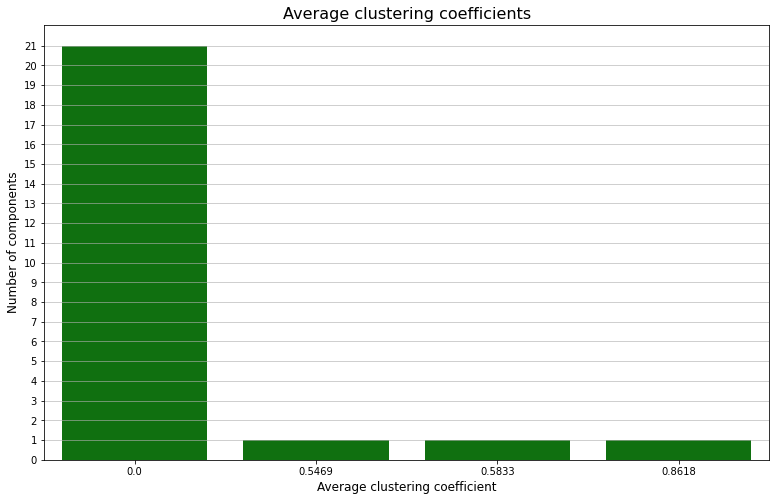

In [37]:
plt.figure(figsize = (13, 8))

plt.title('Average clustering coefficients', fontsize = 16)
sns.barplot(rounded_values, avg_cc_counts.values, color = 'green')
plt.yticks(range(0, 22, 1))
plt.grid(axis = 'y', alpha = 0.75)
plt.xlabel('Average clustering coefficient', fontsize = 12)
plt.ylabel('Number of components', fontsize = 12)


plt.show()

### Average path length

In [38]:
i = 1
average_path_lengths = []
for connected_component in connected_components:
  print('Component {} - number of nodes: {}'.format(i, len(connected_component)))
  print('Average path length: ', nx.average_shortest_path_length(G.subgraph(connected_component).copy()))
  print('------------------------------------------')
  average_path_lengths.append(nx.average_shortest_path_length(G.subgraph(connected_component).copy()))
  i += 1

Component 1 - number of nodes: 277
Average path length:  2.8239418197038666
------------------------------------------
Component 2 - number of nodes: 27
Average path length:  1.227920227920228
------------------------------------------
Component 3 - number of nodes: 4
Average path length:  1.3333333333333333
------------------------------------------
Component 4 - number of nodes: 3
Average path length:  1.3333333333333333
------------------------------------------
Component 5 - number of nodes: 2
Average path length:  1.0
------------------------------------------
Component 6 - number of nodes: 2
Average path length:  1.0
------------------------------------------
Component 7 - number of nodes: 1
Average path length:  0
------------------------------------------
Component 8 - number of nodes: 1
Average path length:  0
------------------------------------------
Component 9 - number of nodes: 1
Average path length:  0
------------------------------------------
Component 10 - number of n

In [39]:
avg_paths_counts = pd.value_counts(average_path_lengths)
print('Number of communities for each average path length:')
print(avg_paths_counts)

Number of communities for each average path length:
0.000000    18
1.333333     2
1.000000     2
1.227920     1
2.823942     1
dtype: int64


In [40]:
rounded_values_pl = []
for val in avg_paths_counts.index:
    rounded_values_pl.append(round(val, 4))

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


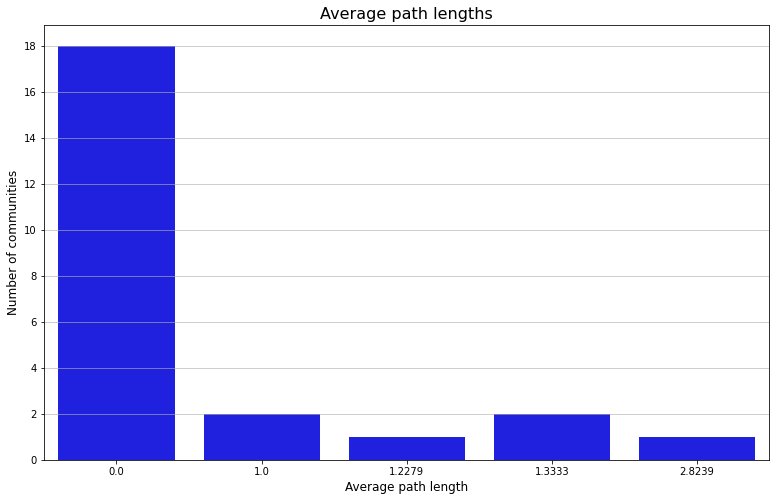

In [41]:
plt.figure(figsize = (13, 8))

plt.title('Average path lengths', fontsize = 16)
sns.barplot(rounded_values_pl, avg_paths_counts.values, color = 'blue')
plt.yticks(range(0, 20, 2))
plt.grid(axis = 'y', alpha = 0.75)
plt.xlabel('Average path length', fontsize = 12)
plt.ylabel('Number of communities', fontsize = 12)


plt.show()

### Degree distribution

In [42]:
degree_sequence = [d for n, d in G.degree()]

min_degree = np.min(degree_sequence)
max_degree = np.max(degree_sequence)
mean_degree = np.mean(degree_sequence)

print('Minimal value of node degree (whole network): ', min_degree)
print('Maximal value of node degree (whole network): ', max_degree)
print('Mean value of node degrees (whole network): ', round(mean_degree, 3))

Minimal value of node degree (whole network):  0
Maximal value of node degree (whole network):  78
Mean value of node degrees (whole network):  18.529


In [43]:
biggest_cc = G.subgraph(connected_components[0])
deg_sequence_cc = [d for n, d in biggest_cc.degree()]

min_degree_cc = np.min(deg_sequence_cc)
max_degree_cc = np.max(deg_sequence_cc)
mean_degree_cc = np.mean(deg_sequence_cc)

print('Minimal value of node degree (biggest component): ', min_degree_cc)
print('Maximal value of node degree (biggest component): ', max_degree_cc)
print('Mean value of node degrees (biggest component): ', round(mean_degree_cc, 3))

Minimal value of node degree (biggest component):  1
Maximal value of node degree (biggest component):  78
Mean value of node degrees (biggest component):  20.224


In [44]:
i = 0

for d in degree_sequence:
  if d == max_degree:
    i += 1

print('Number of nodes with maximal degree in my network: ', i)

Number of nodes with maximal degree in my network:  1


In [45]:
for i in range(len(degree_sequence)):
  if degree_sequence[i] == max_degree:
    print('Name and Surname:', nx.get_node_attributes(G, 'name_and_surname')[i])
    if nx.get_node_attributes(G, 'gender')[i] == 'f':
      print('Gender: Female')
    else:
      print('Gender: Male')
    print('Hometown:', nx.get_node_attributes(G, 'hometown')[i])
    if nx.get_node_attributes(G, 'education_level')[i] == 0:
      print('Education level: Not specified')
    elif nx.get_node_attributes(G, 'education_level')[i] == 1:
      print('Education level: High school')
    else:
      print('Education level: University')

Name and Surname: Ana Nikolic
Gender: Female
Hometown: Belgrade
Education level: University


Ana Nikolic is my friend from high school but we also both studied in the same program on the Faculty of Mathematics at the University of Belgrade, so we have both people from high school and university in mutual friends.

In [46]:
num_of_nodes = len(G.nodes)
degrees_value_counts = pd.value_counts(degree_sequence)
degrees_value_counts.sort_index(inplace = True)

print('Number of mutual friends : Number of nodes')
print('------------------------------------------')
print(degrees_value_counts)

pdf = degrees_value_counts / num_of_nodes
cdf = np.cumsum(pdf)

Number of mutual friends : Number of nodes
------------------------------------------
0     18
1     14
2     11
3     15
4      5
5     12
6      3
7     10
8      5
9      7
10    10
11    11
12    11
13     7
14     5
15    13
16     8
17     5
18     6
19     6
20    12
21    13
22    13
23    12
24    10
25     8
26     7
27     4
28     6
29     4
30     4
32     6
33     1
34     4
35     1
36     6
37     4
38     2
39     2
40     4
41     2
42     3
44     1
45     1
46     2
47     4
48     3
49     1
50     2
51     3
54     1
58     2
59     1
61     1
78     1
dtype: int64


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


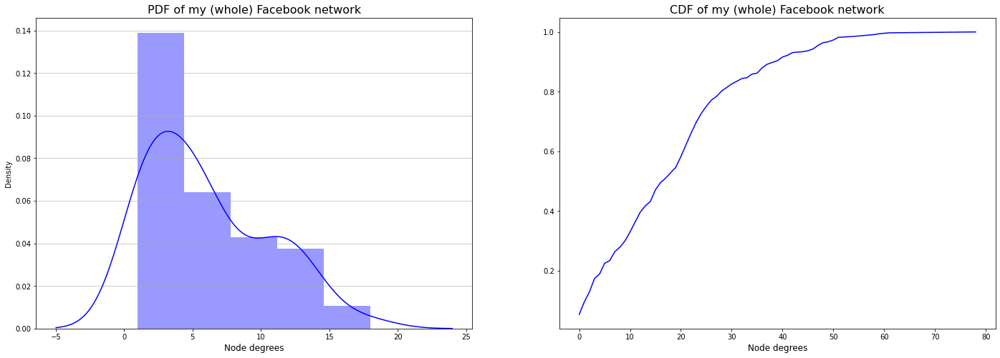

In [47]:
plt.figure(figsize = (12 * 2, 8))

plt.subplot(1, 2, 1)
plt.title('PDF of my (whole) Facebook network', fontsize = 16)
sns.distplot(degrees_value_counts, color = 'blue')
plt.grid(axis = 'y', alpha = 0.75)
plt.xlabel('Node degrees', fontsize = 12)

plt.subplot(1, 2, 2)
plt.title('CDF of my (whole) Facebook network', fontsize = 16)
plt.plot(cdf, color = 'blue')
plt.xlabel('Node degrees', fontsize = 12)

plt.show()

From the previous histogram we can see that with most people in my network I share up to five connections.

In [48]:
def power_law_pdf(x, alpha, x_min):
    
    C = (alpha - 1) / x_min ** (1 - alpha)
    
    return C * x ** (-alpha)

def power_law_cdf(x, alpha, x_min):
    
    C = (alpha - 1) / x_min ** (1 - alpha)
    CDF = 1 + C / (1 - alpha) * x ** (1 - alpha)

    return CDF

In [49]:
def mle_power_law_params(degree_sequence):

    x = np.sort(degree_sequence)
    x_mins = x[:-1]
    x_mins = [float('{:.1f}'.format(i)) for i in x_mins]
    x_mins = list(set(x_mins))    
    best_ks = float('inf')
    
    for x_min in x_mins:
        
        new_x = x[x >= x_min]
        n = len(new_x)
        alpha = 1 + n / np.sum(np.log(new_x / x_min))
        ks = scipy.stats.kstest(new_x, lambda a: power_law_cdf(a, alpha, x_min))[0]
       
        if ks < best_ks:
           best_ks = ks
           alpha_hat = alpha
           x_min_hat = x_min
     
    return alpha_hat, x_min_hat  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in true_divide
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]


Text(0.5, 1.0, 'CDF in log-log scale')

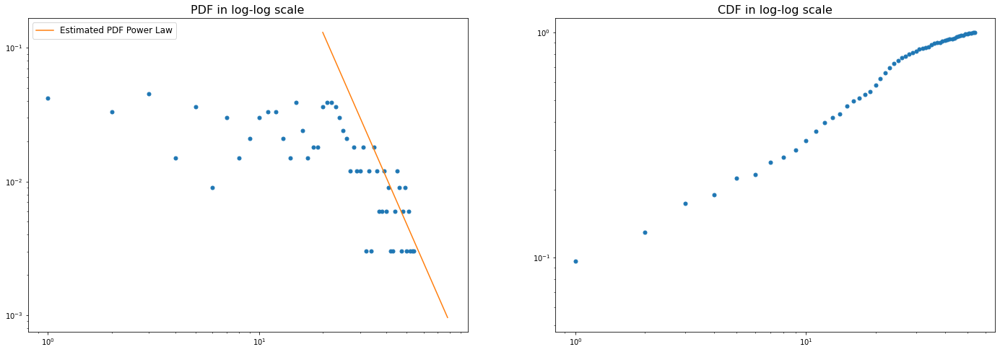

In [50]:
hat_alpha, hat_x_min = mle_power_law_params(degree_sequence)
x_space = np.linspace(hat_x_min, np.max(degree_sequence), 1000)

plt.figure(figsize = (12 * 2, 8))

plt.subplot(1, 2, 1)
plt.loglog(range(0, len(pdf)), pdf, marker = '.', markersize = 10, linestyle = '')
line1, = plt.plot(x_space, power_law_pdf(x_space, hat_alpha, hat_x_min), 
                label = 'Estimated PDF Power Law', c = 'tab:orange')
plt.legend(handles = [line1], loc = 'upper left', fontsize = 12)
plt.title('PDF in log-log scale', fontsize = 16)

plt.subplot(1, 2, 2)
plt.loglog(range(0, len(cdf)), cdf, marker = '.', markersize = 10, linestyle = '')
plt.title('CDF in log-log scale', fontsize = 16)

## Structural Analysis

### The closest random graph model similar to your social network

In [51]:
n = nx.number_of_nodes(biggest_cc)
m = nx.number_of_edges(biggest_cc)
k = np.mean(deg_sequence_cc)

ER = nx.erdos_renyi_graph(n, m / (n * (n - 1) / 2))
BA = nx.barabasi_albert_graph(n, int(m / n))
WS = nx.watts_strogatz_graph(n, int(k), 0.5)

In [52]:
degrees_ER = [d for n, d in ER.degree()]
degrees_BA = [d for n, d in BA.degree()]
degrees_WS = [d for n, d in WS.degree()]

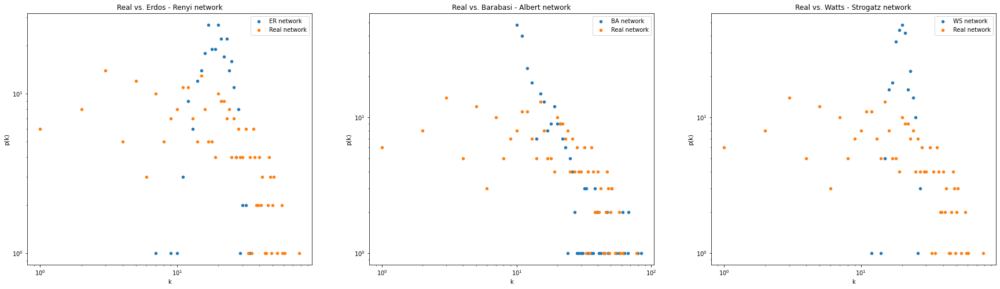

In [53]:
plt.figure(figsize = (10 * 3, 8))

plt.subplot(1, 3, 1)
degree_hist = np.array(nx.degree_histogram(ER))
idx = np.argwhere(degree_hist > 0)
plt.scatter(idx, degree_hist[idx], s = 20, label = 'ER network')
degree_hist = np.array(nx.degree_histogram(biggest_cc))
idx = np.argwhere(degree_hist > 0)
plt.scatter(idx, degree_hist[idx], s = 20, label = 'Real network')
plt.legend()
plt.xlabel('k')
plt.ylabel('p(k)')
plt.title('Real vs. Erdos - Renyi network')
plt.xscale('log')
plt.yscale('log')

plt.subplot(1, 3, 2)
degree_hist = np.array(nx.degree_histogram(BA))
idx = np.argwhere(degree_hist > 0)
plt.scatter(idx, degree_hist[idx], s = 20, label = 'BA network')
degree_hist = np.array(nx.degree_histogram(biggest_cc))
idx = np.argwhere(degree_hist > 0)
plt.scatter(idx, degree_hist[idx], s = 20, label = 'Real network')
plt.legend()
plt.xlabel('k')
plt.ylabel('p(k)')
plt.title('Real vs. Barabasi - Albert network')
plt.xscale('log')
plt.yscale('log')

plt.subplot(1, 3, 3)
degree_hist = np.array(nx.degree_histogram(WS))
idx = np.argwhere(degree_hist > 0)
plt.scatter(idx, degree_hist[idx], s = 20, label = 'WS network')
degree_hist = np.array(nx.degree_histogram(biggest_cc))
idx = np.argwhere(degree_hist > 0)
plt.scatter(idx, degree_hist[idx], s = 20, label = 'Real network')
plt.legend()
plt.xlabel('k')
plt.ylabel('p(k)')
plt.title('Real vs. Watts - Strogatz network')
plt.xscale('log')
plt.yscale('log')

plt.show()

In [54]:
diam_real = nx.diameter(biggest_cc)
diam_ER = nx.diameter(ER)
diam_BA = nx.diameter(BA)
diam_WS = nx.diameter(WS)

rad_real = nx.radius(biggest_cc)
rad_ER = nx.radius(ER)
rad_BA = nx.radius(BA)
rad_WS = nx.radius(WS)

clus_coeff_real = nx.average_clustering(biggest_cc)
clus_coeff_ER = nx.average_clustering(ER)
clus_coeff_BA = nx.average_clustering(BA)
clus_coeff_WS = nx.average_clustering(WS)

path_length_real = nx.average_shortest_path_length(biggest_cc)
path_length_ER = nx.average_shortest_path_length(ER)
path_length_BA = nx.average_shortest_path_length(BA)
path_length_WS = nx.average_shortest_path_length(WS)

KS_ER = scipy.stats.ks_2samp(deg_sequence_cc, degrees_ER)
KS_BA = scipy.stats.ks_2samp(deg_sequence_cc, degrees_BA)
KS_WS = scipy.stats.ks_2samp(deg_sequence_cc, degrees_WS)

AD_ER = scipy.stats.anderson_ksamp([deg_sequence_cc, degrees_ER])
AD_BA = scipy.stats.anderson_ksamp([deg_sequence_cc, degrees_BA])
AD_WS = scipy.stats.anderson_ksamp([deg_sequence_cc, degrees_WS])


data = {}

data['networks'] = ['Real network', 'Erdos - Renyi network', 'Barabasi - Albert network', 'Watts - Strogatz network']
data['diameter'] = [diam_real, diam_ER, diam_BA, diam_WS]
data['radius'] = [rad_real, rad_ER, rad_BA, rad_WS]
data['clustering coefficient'] = [clus_coeff_real, clus_coeff_ER, clus_coeff_BA, clus_coeff_WS]
data['average path length'] = [path_length_real, path_length_ER, path_length_BA, path_length_WS]
data['KS test statistics'] = ['/', KS_ER[0], KS_BA[0], KS_WS[0]]
data['KS p values'] = ['/', KS_ER[1], KS_BA[1], KS_WS[1]]
data['AD test statistics'] = ['/', AD_ER[0], AD_BA[0], AD_WS[0]]
data['AD p values'] = ['/', AD_ER[1][2], AD_BA[1][2], AD_WS[1][2]]

df_networks = pd.DataFrame(data)
df_networks

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: UserWarning: p-value floored: true value smaller than 0.001
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: UserWarning: p-value floored: true value smaller than 0.001
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: UserWarning: p-value floored: true value smaller than 0.001


,networks,diameter,radius,clustering coefficient,average path length,KS test statistics,KS p values,AD test statistics,AD p values
0,Real network,8,4,0.546855,2.823942,/,/,/,/
1,Erdos - Renyi network,3,3,0.076151,2.158426,0.310469,3.41449e-12,42.5792,1.961
2,Barabasi - Albert network,3,2,0.142924,2.158845,0.252708,3.53952e-08,17.3404,1.961
3,Watts - Strogatz network,3,3,0.144872,2.201904,0.425993,6.31322e-23,63.6577,1.961


I used both (two-sample) Kolmogorov-Smirnov and Anderson–Darling tests to compare degree distributions of real network and each of these three models.

From the results, we can see that there is a big difference in values of diameter and clustering coefficient between my network and all three other models. 

I also checked difference between value of radius of the real network and each of these models even though it is not among three real world network properties. We can see that the difference is not as big as for diameter, but especially for Barabasi-Albert model, it is not negligible.

When it comes to statistical testing, in both of these tests, null hypothesys states that both data samples come from the same distribution. The p-value is the evidence against a null hypothesis. The smaller the p-value, the stronger the evidence that we should reject the null hypothesis. Based on that, looking at our results, we can conclude that, from these three models, Barabasi-Albert network model is the most similar to the real network.

### Degree/Closeness/Betweenness centralities

In [55]:
degree_centralities = nx.degree_centrality(biggest_cc)
closeness_centralities = nx.closeness_centrality(biggest_cc)
betweenness_centralities = nx.betweenness_centrality(biggest_cc)
eigenvector_centralities = nx.eigenvector_centrality(biggest_cc)
pagerank075 = nx.pagerank(biggest_cc, alpha = 0.75)
pagerank085 = nx.pagerank(biggest_cc, alpha = 0.85)
pagerank095 = nx.pagerank(biggest_cc, alpha = 0.95)

In [56]:
nx.set_node_attributes(biggest_cc, degree_centralities, 'degree_centrality')
nx.set_node_attributes(biggest_cc, closeness_centralities, 'closeness_centrality')
nx.set_node_attributes(biggest_cc, betweenness_centralities, 'betweenness_centrality')
nx.set_node_attributes(biggest_cc, eigenvector_centralities, 'eigenvector_centrality')
nx.set_node_attributes(biggest_cc, pagerank075, 'pagerank075')
nx.set_node_attributes(biggest_cc, pagerank085, 'pagerank085')
nx.set_node_attributes(biggest_cc, pagerank095, 'pagerank095')

In [57]:
graph = biggest_cc.nodes(data = True)

data = {}

data['id'] = [x[1]['id'] for x in graph]
data['name_and_surname'] = [x[1]['name_and_surname'] for x in graph]
data['gender'] = [x[1]['gender'] for x in graph]
data['hometown'] = [x[1]['hometown'] for x in graph]
data['education_level'] = [x[1]['education_level'] for x in graph]
data['degree_centrality'] = [x[1]['degree_centrality'] for x in graph]
data['closeness_centrality'] = [x[1]['closeness_centrality'] for x in graph]
data['betweenness_centrality'] = [x[1]['betweenness_centrality'] for x in graph]
data['eigenvector_centrality'] = [x[1]['eigenvector_centrality'] for x in graph]
data['pagerank075'] = [x[1]['pagerank075'] for x in graph]
data['pagerank085'] = [x[1]['pagerank085'] for x in graph]
data['pagerank095'] = [x[1]['pagerank095'] for x in graph]

df = pd.DataFrame(data)
df.head(10)

,id,name_and_surname,gender,hometown,education_level,degree_centrality,closeness_centrality,betweenness_centrality,eigenvector_centrality,pagerank075,pagerank085,pagerank095
0,0,Ana Marija Gjurcinova,f,Skopje,2,0.108696,0.407681,0.006167,0.026594,0.004958,0.005164,0.005275
1,1,Sofija Todoric,f,Belgrade,2,0.108696,0.390935,0.001539,0.023605,0.004884,0.005088,0.005234
2,2,Dina Boskovic,f,Belgrade,2,0.184783,0.515888,0.160643,0.070688,0.008481,0.008802,0.008957
3,3,Nadja Velickovic,f,Belgrade,1,0.137681,0.402920,0.022470,0.006954,0.006527,0.006804,0.006979
4,4,Sonja Vukotic,f,Belgrade,2,0.018116,0.357050,0.004061,0.002484,0.001603,0.001334,0.001052
5,5,Emir Custovic,m,Belgrade,1,0.036232,0.370470,0.001984,0.027062,0.002208,0.002017,0.001837
6,6,Nadja Maletic,f,Belgrade,2,0.115942,0.350699,0.004819,0.004083,0.005808,0.005926,0.005949
7,7,Ana Legeza,f,Belgrade,2,0.115942,0.416918,0.016532,0.112263,0.004556,0.004790,0.005207
8,9,Katarina Antonic,f,Belgrade,2,0.072464,0.360313,0.005129,0.006080,0.003567,0.003624,0.003673
9,10,Ivana Ninkovic,f,Trebinje,2,0.025362,0.309071,0.000001,0.001226,0.001818,0.001617,0.001407


#### Degree centrality

The degree centrality for a node v represents the fraction of nodes it is connected to.

In [58]:
df1 = df.sort_values(by = 'degree_centrality', ascending = False)
df1[['id', 'name_and_surname', 'gender', 'hometown', 'degree_centrality']].head(10)

,id,name_and_surname,gender,hometown,degree_centrality
125,145,Ana Nikolic,f,Belgrade,0.282609
126,146,Luka Radosavljevic,m,Belgrade,0.221014
51,65,Vladimir Jelic,m,Belgrade,0.213768
35,45,Teodora Cica Stepanovic,f,Belgrade,0.210145
273,329,Dusan Vondracek,m,Belgrade,0.210145
42,53,Zikica Lukic,m,Uzice,0.195652
22,30,Mihailo Grujic,m,Belgrade,0.184783
44,55,Filip Mandic,m,Belgrade,0.184783
2,2,Dina Boskovic,f,Belgrade,0.184783
68,84,Nikola Jovanovic,m,Belgrade,0.181159


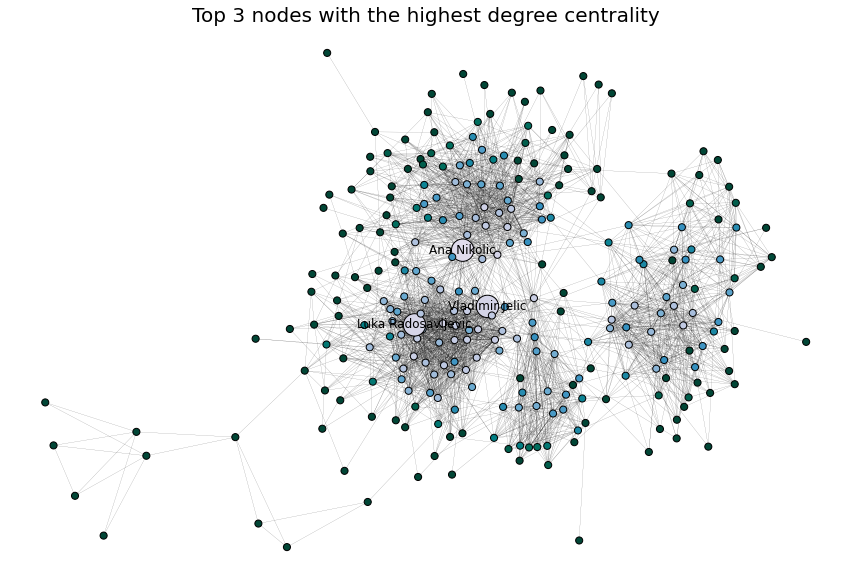

In [59]:
top3dc = df1.head(3)
ids = top3dc.id.values
names_cc = top3dc.name_and_surname.values
labels_dc = {ids[i] : names_cc[i] for i in range(len(ids))}
values_dc = nx.get_node_attributes(biggest_cc, 'degree_centrality')

plt.figure(figsize = (15, 10))

color_map = []
size_map = []

for node in biggest_cc:
    if node in top3dc.id.values:
        color_map.append(cm.PuBuGn(1 / (values_dc[node] * 20)))
        size_map.append(500)
    else: 
        color_map.append(cm.PuBuGn(1 / (values_dc[node] * 20))) 
        size_map.append(50)

nx.draw_networkx(biggest_cc, 
                 pos = nx.kamada_kawai_layout(biggest_cc),
                 node_size = size_map,
                 node_color = color_map,                 
                 labels = labels_dc,
                 edgecolors = 'black',
                 width = 0.1)

plt.title('Top 3 nodes with the highest degree centrality', fontsize = 20)
plt.axis('off')

plt.show()

Top 3 nodes:
---

As I already said, Ana Nikolic is my friend from high school who studied at the same program on the Faculty of Mathematics, at the University of Belgrade. 

---
Luka Radosavljevic is my high school classmate, but we were also attending the same primary school and live in the same neighborhood from where we share all these mutual connections.

---

Vladimir Jelic is my best friend from high school who had also started his undergraduate studies in the Faculty of Mathematics before he decided to change it for Faculty of Mechanical Engineering. As a part of the Formula Student Team of the University of Belgrade, I met many people from the Faculty of Mechanical Engineering, therefore we share many mutual connections from all three places.


#### Closeness centrality

Closeness centrality of a node represents how close that node is to all the other nodes in network.

In [60]:
df2 = df.sort_values(by = 'closeness_centrality', ascending = False)
df2[['id', 'name_and_surname', 'gender', 'hometown', 'closeness_centrality']].head(10)

,id,name_and_surname,gender,hometown,closeness_centrality
2,2,Dina Boskovic,f,Belgrade,0.515888
51,65,Vladimir Jelic,m,Belgrade,0.494624
273,329,Dusan Vondracek,m,Belgrade,0.486772
125,145,Ana Nikolic,f,Belgrade,0.484211
219,269,Nikola Milicevic,m,Belgrade,0.468591
152,180,Ivan Rovic,m,Belgrade,0.464646
35,45,Teodora Cica Stepanovic,f,Belgrade,0.462312
127,147,Stefan Miloradovic,m,Belgrade,0.458472
22,30,Mihailo Grujic,m,Belgrade,0.454695
68,84,Nikola Jovanovic,m,Belgrade,0.448780


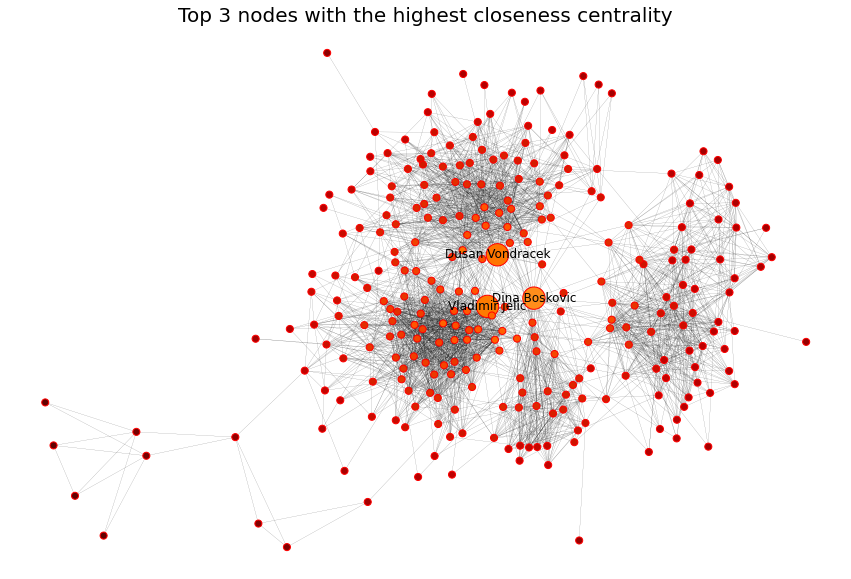

In [61]:
top3cc = df2.head(3)
ids = top3cc.id.values
names_cc = top3cc.name_and_surname.values
labels_cc = {ids[i] : names_cc[i] for i in range(len(ids))}
values_cc = nx.get_node_attributes(biggest_cc, 'closeness_centrality')

plt.figure(figsize = (15, 10))

color_map = []
size_map = []

for node in biggest_cc:
    if node in top3cc.id.values:
        color_map.append(cm.gist_heat(values_cc[node] * 1.5))
        size_map.append(500)
    else: 
        color_map.append(cm.gist_heat(values_cc[node] * 1.5)) 
        size_map.append(50)

nx.draw_networkx(biggest_cc, 
                 pos = nx.kamada_kawai_layout(biggest_cc),
                 node_size = size_map,
                 node_color = color_map,                 
                 labels = labels_cc,
                 edgecolors = 'red',
                 width = 0.1)

plt.title('Top 3 nodes with the highest closeness centrality', fontsize = 20)
plt.axis('off')

plt.show()

Top 3 nodes:
---

Dina Boskovic is my best friend. We know each other from kindergarten and although we did not share the same primary, high school, or faculty, she knows most of my friends. She was also a part of the same Formula Student team, so we have mutual friends from there too.

---

Vladimir Jelic is my best friend from high school (already explained in the previous subsection).

---

Dusan Vondracek is my friend from high school, but we were also attending the same undergraduate program in the Faculty of Mathematics. He is a sociable person. 



#### Betweenness centrality

Betweenness centrality of a node is the sum of the fraction of all-pairs shortest paths that pass through that node.

In [62]:
df3 = df.sort_values(by = 'betweenness_centrality', ascending = False)
df3[['id', 'name_and_surname', 'gender', 'hometown', 'betweenness_centrality']].head(10)

,id,name_and_surname,gender,hometown,betweenness_centrality
2,2,Dina Boskovic,f,Belgrade,0.160643
125,145,Ana Nikolic,f,Belgrade,0.088875
273,329,Dusan Vondracek,m,Belgrade,0.078342
30,40,Filip Milisavljevic,m,Belgrade,0.066149
157,187,Snezana Ilic,f,Belgrade,0.052010
223,273,Nada Kucuk,f,Not specified,0.045012
51,65,Vladimir Jelic,m,Belgrade,0.044941
84,101,Marija Seslija,f,Belgrade,0.035732
158,188,Jovana Dudukovic,f,Sombor,0.033932
153,182,Bozidar Race,m,Belgrade,0.032461


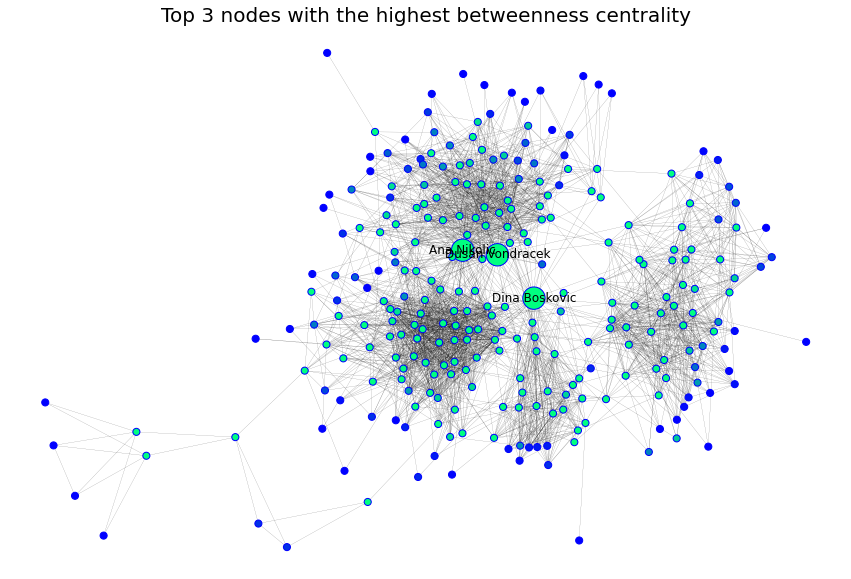

In [63]:
top3bc = df3.head(3)
ids = top3bc.id.values
names_bc = top3bc.name_and_surname.values
labels_bc = {ids[i] : names_bc[i] for i in range(len(ids))}
values_bc = nx.get_node_attributes(biggest_cc, 'betweenness_centrality')

plt.figure(figsize = (15, 10))

color_map = []
size_map = []

for node in biggest_cc:
    if node in top3bc.id.values:
        color_map.append(cm.winter(values_bc[node] * 100))
        size_map.append(500)
    else: 
        color_map.append(cm.winter(values_bc[node] * 1000)) 
        size_map.append(50)

nx.draw_networkx(biggest_cc, 
                 pos = nx.kamada_kawai_layout(biggest_cc),
                 node_size = size_map,
                 node_color = color_map,                 
                 labels = labels_bc,
                 edgecolors = 'blue',
                 width = 0.1)

plt.title('Top 3 nodes with the highest betweenness centrality', fontsize = 20)
plt.axis('off')

plt.show()

Top 3 nodes:
---

Again I got three people I had already found as 'important' in my network:

---

Dina Boskovic - my best friend that knows most of my other friends. We have my friends from primary and high school, faculty and Formula Student Team in mutual friends, so she belongs to several communities in my network. 

---

Ana Nikolic - my friend with whom I share the most mutual connections among which are people from both high school and university. 

---

Dusan Vondracek - my friend from high school and university, that belongs to both of these communities in my network.



#### Eigenvector centrality

Eigenvector centrality is a measure of the influence of a node in a network. A high eigenvector score means that a node is connected to many nodes who  themselves have high scores.

In [64]:
df4 = df.sort_values(by = 'eigenvector_centrality', ascending = False)
df4[['id', 'name_and_surname', 'gender', 'hometown', 'eigenvector_centrality']].head(10)

,id,name_and_surname,gender,hometown,eigenvector_centrality
35,45,Teodora Cica Stepanovic,f,Belgrade,0.185807
51,65,Vladimir Jelic,m,Belgrade,0.184551
126,146,Luka Radosavljevic,m,Belgrade,0.180667
22,30,Mihailo Grujic,m,Belgrade,0.179264
152,180,Ivan Rovic,m,Belgrade,0.176717
44,55,Filip Mandic,m,Belgrade,0.176488
119,139,Petar Kovacevic,m,Belgrade,0.172664
79,96,Djordje Lazic,m,Belgrade,0.168941
68,84,Nikola Jovanovic,m,Belgrade,0.168714
246,299,Ivan Zivotic,m,Belgrade,0.166873


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  c = np.array(c)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


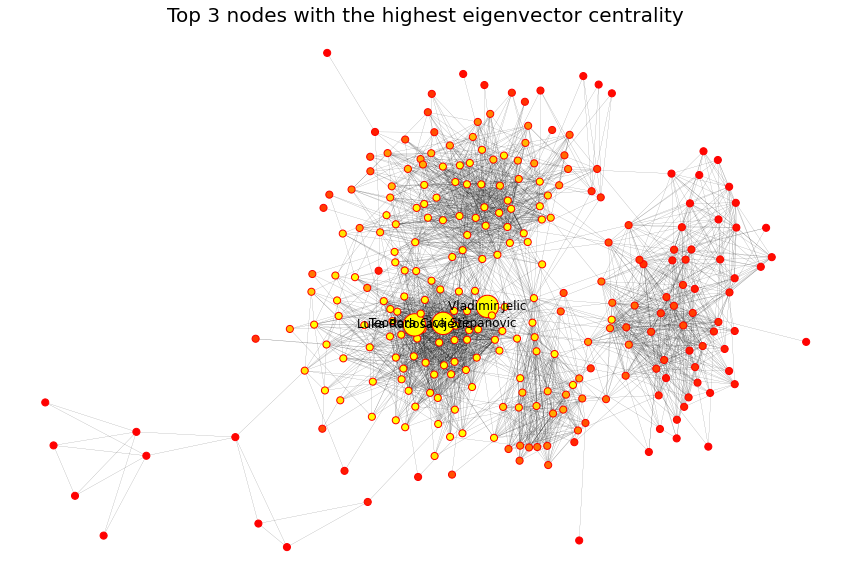

In [65]:
top3ec = df4.head(3)
ids = top3ec.id.values
names_ec = top3ec.name_and_surname.values
labels_ec = {ids[i] : names_ec[i] for i in range(len(ids))}
values_ec = nx.get_node_attributes(biggest_cc, 'eigenvector_centrality')

plt.figure(figsize = (15, 10))

color_map = []
size_map = []

for node in biggest_cc:
    if node in top3ec.id.values:
        color_map.append('yellow')
        size_map.append(500)
    else: 
        color_map.append(cm.autumn(values_ec[node] * 60)) 
        size_map.append(50)

nx.draw_networkx(biggest_cc, 
                 pos = nx.kamada_kawai_layout(biggest_cc),
                 node_size = size_map,
                 node_color = color_map,                 
                 labels = labels_ec,
                 edgecolors = 'red',
                 width = 0.1)

plt.title('Top 3 nodes with the highest eigenvector centrality', fontsize = 20)
plt.axis('off')

plt.show()

Top 3 nodes:
---

Teodora Cica Stepanovic is my friend from high school. She has many connections on Facebook.

---

Vladimir Jelic is my best friend from high school with whom I share many connections.

---

Luka Radosavljevic is my friend from both primary and high school. He is a really sociable person.

#### Page-Rank

The PageRank algorithm outputs a probability distribution used to represent the likelihood that starting from one node and randomly choosing edge from current to any other connected node, will arrive to any particular node.

In [66]:
df5 = df.sort_values(by = 'pagerank075', ascending = False)
df5[['id', 'name_and_surname', 'gender', 'hometown', 'pagerank075']].head(10)

,id,name_and_surname,gender,hometown,pagerank075
125,145,Ana Nikolic,f,Belgrade,0.011931
273,329,Dusan Vondracek,m,Belgrade,0.008862
42,53,Zikica Lukic,m,Uzice,0.008654
2,2,Dina Boskovic,f,Belgrade,0.008481
135,156,Anastasija Pesic,f,Leskovac,0.008201
126,146,Luka Radosavljevic,m,Belgrade,0.008182
65,81,Predrag Pilipovic,m,Belgrade,0.008016
38,49,Mia Hadzic,f,Belgrade,0.007908
91,108,Ivana Basaragin,f,Belgrade,0.007628
51,65,Vladimir Jelic,m,Belgrade,0.007456


In [67]:
df6 = df.sort_values(by = 'pagerank085', ascending = False)
df6[['id', 'name_and_surname', 'gender', 'hometown', 'pagerank085']].head(10)

,id,name_and_surname,gender,hometown,pagerank085
125,145,Ana Nikolic,f,Belgrade,0.012599
273,329,Dusan Vondracek,m,Belgrade,0.009411
42,53,Zikica Lukic,m,Uzice,0.009141
126,146,Luka Radosavljevic,m,Belgrade,0.008822
2,2,Dina Boskovic,f,Belgrade,0.008802
135,156,Anastasija Pesic,f,Leskovac,0.008440
38,49,Mia Hadzic,f,Belgrade,0.008335
51,65,Vladimir Jelic,m,Belgrade,0.008213
35,45,Teodora Cica Stepanovic,f,Belgrade,0.008077
91,108,Ivana Basaragin,f,Belgrade,0.008054


In [68]:
df7 = df.sort_values(by = 'pagerank095', ascending = False)
df7[['id', 'name_and_surname', 'gender', 'hometown', 'pagerank095']].head(10)

,id,name_and_surname,gender,hometown,pagerank095
125,145,Ana Nikolic,f,Belgrade,0.013240
273,329,Dusan Vondracek,m,Belgrade,0.009907
126,146,Luka Radosavljevic,m,Belgrade,0.009800
42,53,Zikica Lukic,m,Uzice,0.009443
51,65,Vladimir Jelic,m,Belgrade,0.009360
35,45,Teodora Cica Stepanovic,f,Belgrade,0.009175
2,2,Dina Boskovic,f,Belgrade,0.008957
38,49,Mia Hadzic,f,Belgrade,0.008629
135,156,Anastasija Pesic,f,Leskovac,0.008413
91,108,Ivana Basaragin,f,Belgrade,0.008352


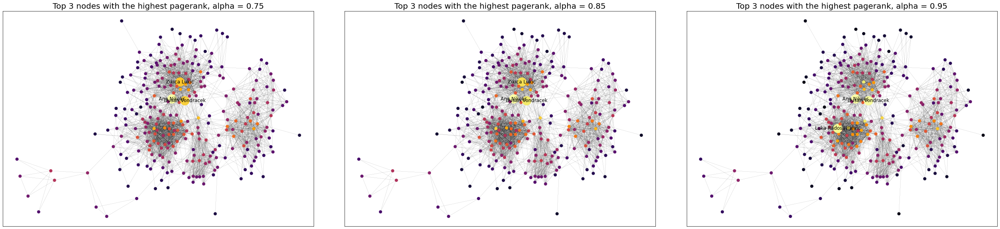

In [69]:
top3pr075 = df5.head(3)
ids = top3pr075.id.values
names_pr075 = top3pr075.name_and_surname.values
labels_pr075 = {ids[i] : names_pr075[i] for i in range(len(ids))}
values_pr075 = nx.get_node_attributes(biggest_cc, 'pagerank075')

top3pr085 = df6.head(3)
ids = top3pr085.id.values
names_pr085 = top3pr085.name_and_surname.values
labels_pr085 = {ids[i] : names_pr085[i] for i in range(len(ids))}
values_pr085 = nx.get_node_attributes(biggest_cc, 'pagerank085')

top3pr095 = df7.head(3)
ids = top3pr095.id.values
names_pr095 = top3pr095.name_and_surname.values
labels_pr095 = {ids[i] : names_pr095[i] for i in range(len(ids))}
values_pr095 = nx.get_node_attributes(biggest_cc, 'pagerank095')

plt.figure(figsize = (15 * 3, 10))
plt.subplots_adjust(wspace = 0.1)

color_map1 = []
size_map1 = []
color_map2 = []
size_map2 = []
color_map3 = []
size_map3 = []

for node in biggest_cc:
    if node in top3pr075.id.values:
        color_map1.append(cm.inferno(values_pr075[node] * 100))
        size_map1.append(500)
    else: 
        color_map1.append(cm.inferno(values_pr075[node] * 100)) 
        size_map1.append(50)

for node in biggest_cc:
    if node in top3pr085.id.values:
        color_map2.append(cm.inferno(values_pr085[node] * 100))
        size_map2.append(500)
    else: 
        color_map2.append(cm.inferno(values_pr085[node] * 100)) 
        size_map2.append(50)

for node in biggest_cc:
    if node in top3pr095.id.values:
        color_map3.append(cm.inferno(values_pr095[node] * 100))
        size_map3.append(500)
    else: 
        color_map3.append(cm.inferno(values_pr095[node] * 100)) 
        size_map3.append(50)

plt.subplot(1, 3, 1)
nx.draw_networkx(biggest_cc, 
                 pos = nx.kamada_kawai_layout(biggest_cc),
                 node_size = size_map1,
                 node_color = color_map1,                 
                 labels = labels_pr075,
                 width = 0.1)
plt.title('Top 3 nodes with the highest pagerank, alpha = 0.75', fontsize = 20)

plt.subplot(1, 3, 2)
nx.draw_networkx(biggest_cc, 
                 pos = nx.kamada_kawai_layout(biggest_cc),
                 node_size = size_map2,
                 node_color = color_map2,                 
                 labels = labels_pr085,
                 width = 0.1)
plt.title('Top 3 nodes with the highest pagerank, alpha = 0.85', fontsize = 20)

plt.subplot(1, 3, 3)
nx.draw_networkx(biggest_cc, 
                 pos = nx.kamada_kawai_layout(biggest_cc),
                 node_size = size_map3,
                 node_color = color_map3,                 
                 labels = labels_pr095,
                 width = 0.1)
plt.title('Top 3 nodes with the highest pagerank, alpha = 0.95', fontsize = 20)

plt.show()

In [70]:
print('Number of connections I share with Zikica Lukic: ', G.degree[53])

Number of connections I share with Zikica Lukic:  54


Ana Nikolic and Dusan Vondracek are placed in the first two positions for all three possible values of alpha. It was not unexpected, since we share many connections and they belong to both my high school and university groups.

Also, as already mentioned Luka Radosavljevic belongs to both my primary and high school groups, so it was expected to have high PageRank score.

Surprisingly for me, Zikica Lukic is placed third for both $\alpha = 0.75$ and $\alpha = 0.85$. He and I share only connections from university group, but after checking, saw that we are sharing 54 connections, so it makes sense that he has a high score.


#### Correlation comparison

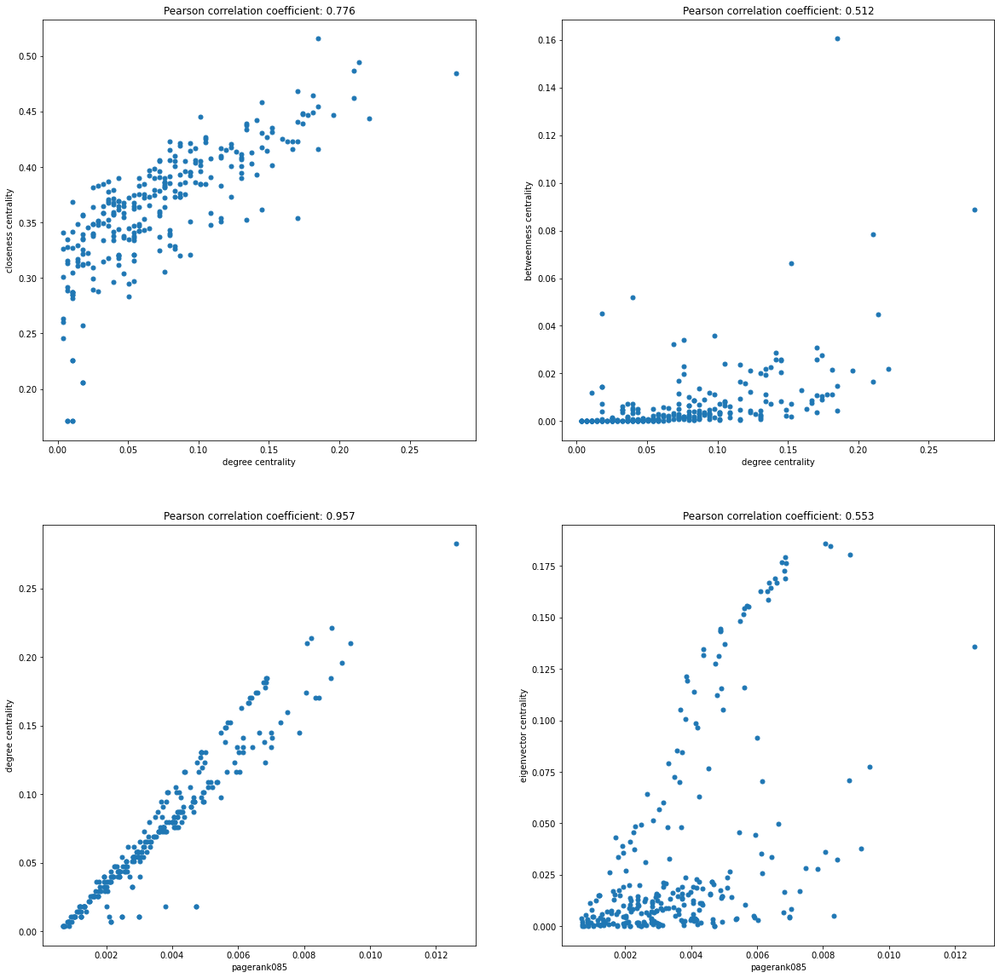

In [71]:
plt.figure(figsize = (10 * 2, 10 * 2))

degree_closeness_coeff = round(scipy.stats.stats.pearsonr(list(degree_centralities.values()), list(closeness_centralities.values()))[0], 3)
degree_betweenness_coeff = round(scipy.stats.stats.pearsonr(list(degree_centralities.values()), list(betweenness_centralities.values()))[0], 3)
pagerank085_degree_coeff = round(scipy.stats.stats.pearsonr(list(pagerank085.values()), list(degree_centralities.values()))[0], 3)
pagerank085_eigenvector_coeff = round(scipy.stats.stats.pearsonr(list(pagerank085.values()), list(eigenvector_centralities.values()))[0], 3)

plt.subplot(2, 2, 1)
plt.plot(list(degree_centralities.values()), list(closeness_centralities.values()), marker = '.', markersize = 10, linestyle = '')
plt.xlabel('degree centrality')
plt.ylabel('closeness centrality')
plt.title('Pearson correlation coefficient: {}'.format(str(degree_closeness_coeff)))

plt.subplot(2, 2, 2)
plt.plot(list(degree_centralities.values()), list(betweenness_centralities.values()), marker = '.', markersize = 10, linestyle = '')
plt.xlabel('degree centrality')
plt.ylabel('betweenness centrality')
plt.title('Pearson correlation coefficient: {}'.format(str(degree_betweenness_coeff)))

plt.subplot(2, 2, 3)
plt.plot(list(pagerank085.values()), list(degree_centralities.values()), marker = '.', markersize = 10, linestyle = '')
plt.xlabel('pagerank085')
plt.ylabel('degree centrality')
plt.title('Pearson correlation coefficient: {}'.format(str(pagerank085_degree_coeff)))

plt.subplot(2, 2, 4)
plt.plot(list(pagerank085.values()), list(eigenvector_centralities.values()), marker = '.', markersize = 10, linestyle = '')
plt.xlabel('pagerank085')
plt.ylabel('eigenvector centrality')
plt.title('Pearson correlation coefficient: {}'.format(str(pagerank085_eigenvector_coeff)))

plt.show()

#### HITS

The HITS algorithm computes two numbers for a node. Authorities estimates the node value based on the incoming links. Hubs estimates the node value based on outgoing links.

Since we are analyzing social network, it is not directed by its nature (if node v is a friend of node u, then node u must be a friend of node v). 

Because of that, for purposes of HITS visualization as one of the requirements, I created new graph using nodes and edges of my original network by randomly choosing one of two possible directions of the edge (either is node v directed to node u or vice versa). 

In [72]:
def friends_digraph(friends, connections):
    
    graph = nx.DiGraph()

    friends_nodes = friends['id'].tolist()
    connections_edges = list(zip(connections['id_from'], connections['id_to']))
    
    graph.add_nodes_from(friends_nodes)
    for i in range(0, len(connections), 2):
      j = random.randint(0, 1)
      graph.add_edge(connections_edges[i + j][0], connections_edges[i + j][1])

    nx.set_node_attributes(graph, friends['id'].to_dict(), 'id')
    nx.set_node_attributes(graph, friends['name_and_surname'].to_dict(), 'name_and_surname')
    nx.set_node_attributes(graph, friends['gender'].to_dict(), 'gender')
    nx.set_node_attributes(graph, friends['relation'].to_dict(), 'relation')
    nx.set_node_attributes(graph, friends['hometown'].to_dict(), 'hometown')
    nx.set_node_attributes(graph, friends['education_level'].to_dict(), 'education_level')

    return graph

In [73]:
G_DiGraph = friends_digraph(friends, connections)

In [74]:
hub, auth = nx.hits(G_DiGraph)

In [75]:
def hits_visualization(G, hub, auth, top):
    
    hub_sorted = np.array(sorted(hub.items(), key = lambda x: x[1], reverse = True))
    auth_sorted = np.array(sorted(auth.items(), key = lambda x: x[1], reverse = True))
    top_hub_sorted = hub_sorted[: top]
    top_auth_sorted = auth_sorted[: top]

    top_subG = G.subgraph(np.concatenate([top_auth_sorted[:, 0], top_hub_sorted[:, 0]])) 

    results = {}

    pos = {}
    for i in range(top):
      pos[top_hub_sorted[i, 0]] = [0, i]
      pos[top_auth_sorted[i, 0]] = [1, i]


    results['h_top'] = top_hub_sorted[:, 0]
    results['a_top'] = top_auth_sorted[:, 0]
    results['h_vals'] = np.array([hub[i] for i in top_subG.nodes()])
    results['a_vals'] = np.array([auth[i] for i in top_subG.nodes()])
    results['subG'] = top_subG
    results['pos'] = pos
    
    return results

In [76]:
vi = hits_visualization(G_DiGraph, hub, auth, 7)
h_top, a_top = vi['h_top'], vi['a_top']
h_vals, a_vals = vi['h_vals'], vi['a_vals']
subG, pos = vi['subG'], vi['pos']

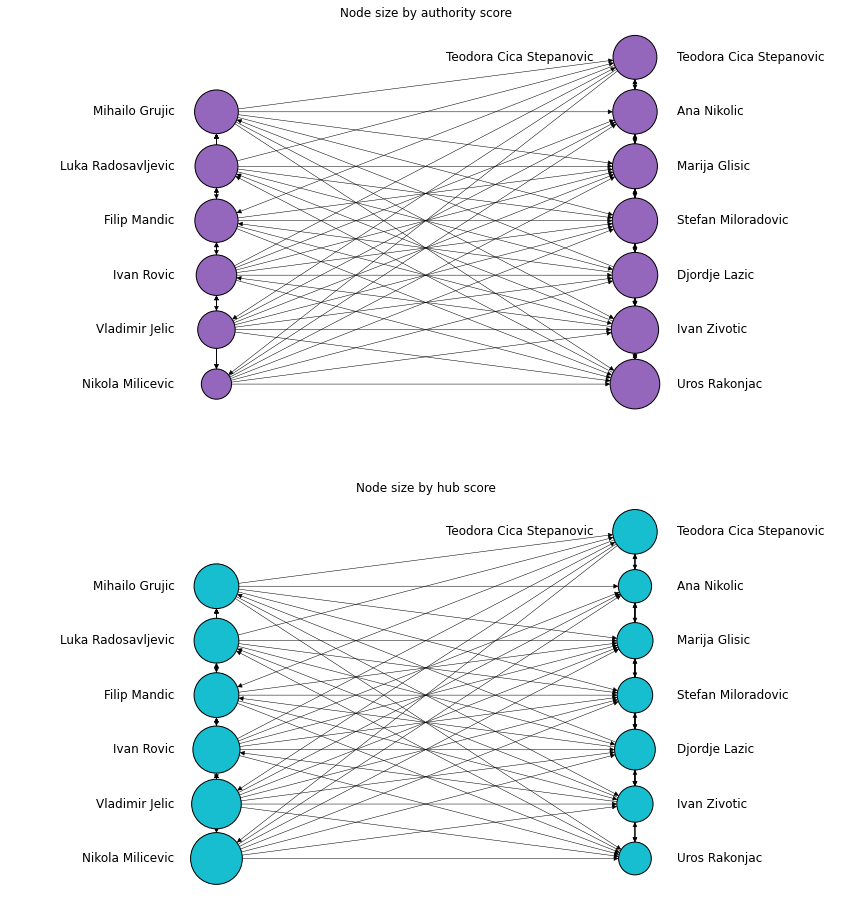

In [77]:
plt.figure(figsize=(15, 8 * 2))

names = nx.get_node_attributes(G_DiGraph, 'name_and_surname')

h_labels = {i : names[i] for i in h_top}
a_labels = {i : names[i] for i in a_top}
a_pos = {node:(pos[node][0] + 0.1, pos[node][1]) for node in pos}
h_pos = {node:(pos[node][0] - 0.1, pos[node][1]) for node in pos}

cases = [[1, 'tab:purple', a_vals, 'Node size by authority score'], 
         [2, 'tab:cyan', h_vals, 'Node size by hub score']]

for i, color, vals, t in cases:
    plt.subplot(2, 1, i)
    plt.gca().axis('off')
    nx.draw_networkx(
        subG,
        pos,
        width = 0.5,
        with_labels = False,
        edgecolors = 'black',
        node_size = vals*1e5,
        node_color = color
    )
    nx.draw_networkx_labels(
        subG,
        pos = a_pos,
        labels = a_labels,
        horizontalalignment = 'left'
    )
    nx.draw_networkx_labels(
        subG,
        pos = h_pos,
        labels = h_labels,
        horizontalalignment = 'right'
    )

    plt.xlim(-0.5, 1.5)
    plt.title(t)

Analyzing results we got does not give us any bigger picture of the original network since we used artificial network in which we randomly chose one of two possible directions of edge we had had in the original one.

### Assortative Mixing

Assortative mixing in networks is the tendency for nodes with the same attributes, or metadata, to link to each other.

In [78]:
def attr_mixing(G, attr):

    mixing = nx.attribute_mixing_matrix(G, attribute = attr)
    attribute_mix = nx.get_node_attributes(G, attr)
    mapping = {}
    
    for key, value in attribute_mix.items():
      mapping[value] = mapping.get(value, []) + [key] 
    
    return mixing, mapping

In [79]:
mixing_gender, mapping_gender = attr_mixing(G, 'gender')
mixing_education, mapping_education = attr_mixing(G, 'education_level')

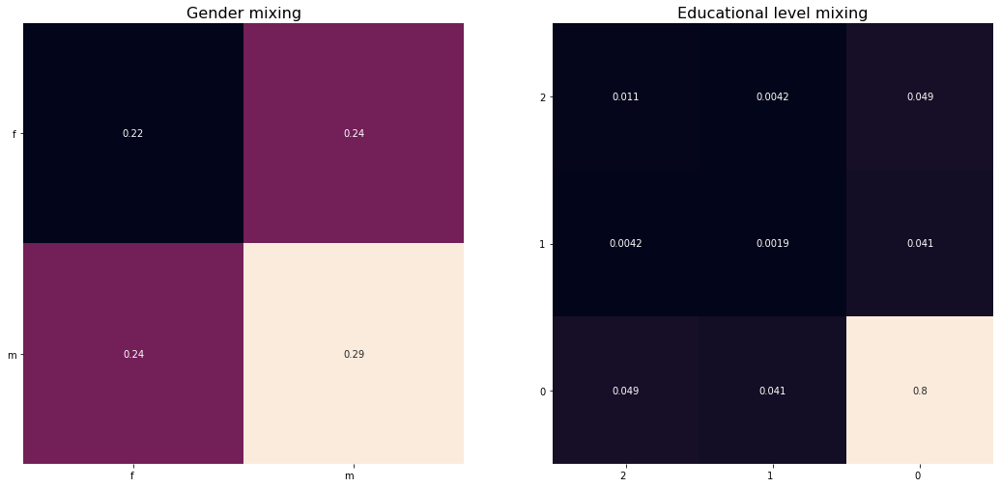

In [80]:
fig = plt.figure(figsize=(9 * 2, 9))

plt.subplot(1, 2, 1)
hmap = sns.heatmap(mixing_gender,
                   cbar = False,
                   annot = True,
                   square = True)
hmap.set_xticklabels(labels = [m for m in mapping_gender], 
                     horizontalalignment = 'right')
hmap.set_yticklabels(labels=[m for m in mapping_gender], 
                     rotation = 0)
plt.title('Gender mixing', fontsize = 16)

plt.subplot(1, 2, 2)
hmap = sns.heatmap(mixing_education,
                   cbar = False,
                   annot = True,
                   square = True)
hmap.set_xticklabels(labels = [m for m in mapping_education], 
                     horizontalalignment = 'right')
hmap.set_yticklabels(labels = [m for m in mapping_education],
                     rotation = 0)
plt.title('Educational level mixing', fontsize = 16)

plt.show()

In [81]:
education = nx.get_node_attributes(G, 'education_level')
education_counter = dict(Counter(education.values()))

print('Number of people with not specified educational level: ', education_counter.get(0))

Number of people with not specified educational level:  38


It is interesting to see on the right plot that people with not specified educational level on their profiles tend more to connect with each other.

In [82]:
print('Assortativity coefficient for gender: ', round(nx.attribute_assortativity_coefficient(G, 'gender'), 3))
print('Assortativity coefficient for educational level: ', round(nx.attribute_assortativity_coefficient(G, 'education_level'), 3))
print('Assortativity coefficient for hometown: ', round(nx.attribute_assortativity_coefficient(G, 'hometown'), 3))

Assortativity coefficient for gender:  0.023
Assortativity coefficient for educational level:  0.073
Assortativity coefficient for hometown:  0.216


Positive values of assortivity coefficient for node attributes indicate a correlation between nodes of the same value for that attribute, while negative values indicate relationships between nodes of different values.

We can see that assortivity coefficient for gender and educational level is not very high which indicates that in my network nodes are connected between each other no matter on the values for attributes gender or educational level.

On the other hand, we can see that assortivity coefficient for attribute hometown is slightly greater which makes sense since people that are classmates during primary or high schools, for example, are usually friends with each other on the Facebook or any other social network and they are probably from the same hometown, especially in case like mine, where hometown is at the same time capital / biggest city in the country.

### Node structural equivalence/similarity

In [83]:
def sim_matrices(G):
    
    A = nx.to_numpy_array(G)
    p = np.corrcoef(A)
    J = np.zeros(A.shape)
    
    for i, j, c in nx.jaccard_coefficient(nx.from_numpy_array(A)):
      J[i, j] = c
      J[j, i] = c
    
    c = cosine_similarity(A)
    
    return A, p, J, c

In [84]:
A, corr, J, cos = sim_matrices(G)

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


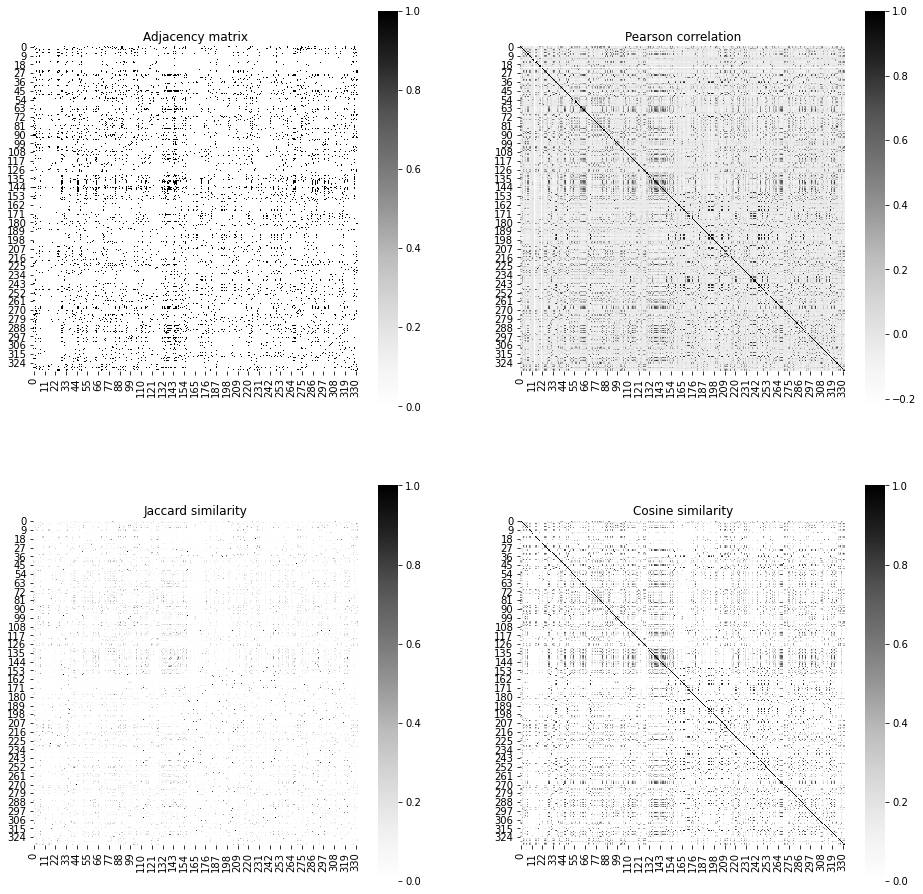

In [85]:
fig = plt.figure(figsize=(8 * 2, 8 * 2))

cases = [[1, A, plt.cm.Greys, 'Adjacency matrix'], 
         [2, corr, plt.cm.Greys, 'Pearson correlation'], 
         [3, J, plt.cm.Greys, 'Jaccard similarity'], 
         [4, cos, plt.cm.Greys, 'Cosine similarity'], ]

for i, matrix, cmap, t in cases:
    plt.subplot(2, 2, i)
    hmap = sns.heatmap(matrix,
                       cmap = cmap,
                       square = True)
    plt.title(t)

In [86]:
def cm_order(G):  
  return reverse_cuthill_mckee(nx.adjacency_matrix(G))

In [87]:
order = cm_order(G)

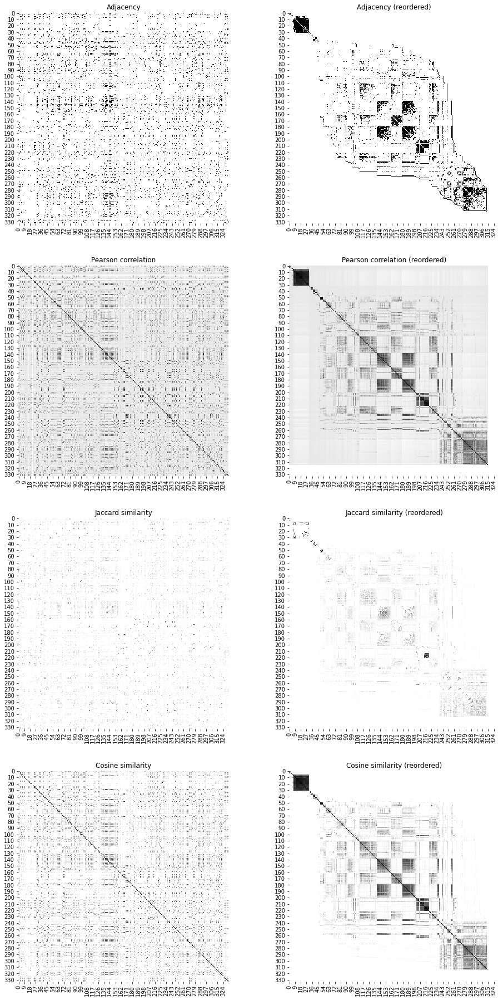

In [88]:
fig = plt.figure(figsize = (16, 16 * 2))

cases = [[1, A, plt.cm.Greys, 'Adjacency', range(333)],
         [2, A, plt.cm.Greys, 'Adjacency (reordered)', order],
         [3, corr, plt.cm.Greys, 'Pearson correlation', range(333)], 
         [4, corr, plt.cm.Greys, 'Pearson correlation (reordered)', order], 
         [5, J, plt.cm.Greys, 'Jaccard similarity', range(333)], 
         [6, J, plt.cm.Greys, 'Jaccard similarity (reordered)', order], 
         [7, cos, plt.cm.Greys, 'Cosine similarity', range(333)], 
         [8, cos, plt.cm.Greys, 'Cosine similarity (reordered)', order]]

for i, matrix, cmap, t, o in cases:
    plt.subplot(4, 2, i)
    hmap = sns.heatmap(
        matrix[np.ix_(o, o)],
        cmap = cmap,
        cbar = False,
        square = True)
    plt.title(t)

Thanks to reordering which puts similar more similar nodes next to each other, we can see that in the network there are three main groups - communities. In the next section, we will more deeply analyze these groups. 

For now, we can see that nodes in the first group - the first and the darkest square are quite similar to each other. Also, in the biggest square, we can see many smaller squares which indicates that there is a group that contains few groups consisted of similar, between each other, nodes.

## Community Detection

### Clique search

In [89]:
cliques = list(nx.find_cliques(G))
max_length = max([len(clique) for clique in cliques])
max_cliques = []

for clique in cliques:
    if len(clique) == max_length:
      max_cliques.append(clique)

In [90]:
print('There are {} cliques in my network.'.format(len(cliques)))
print('Maximal size of a clique in my network is: ', max_length)
print('There are {} cliques of maximal size in my network.'.format(len(max_cliques)))

There are 1731 cliques in my network.
Maximal size of a clique in my network is:  21
There are 18 cliques of maximal size in my network.


In [91]:
maximal_clique = G.subgraph(max_cliques[0])
labels_clique = dict(maximal_clique.nodes('name_and_surname'))

print('Friends in the maximal clique:')
print('--------------------------')
for node in labels_clique:
  print(labels_clique[node])

Friends in the maximal clique:
--------------------------
Marija Glisic
Tijana Jankovic
Uros Rakonjac
Petar Kovacevic
Jovica Kilibarda
Marko Hudomal
Nikola Milicevic
Stefan Miloradovic
Mihailo Grujic
Marija Pesic
Ivan Zivotic
Teodora Cica Stepanovic
Lazar Savovic
Tamara Kamberovic
Ivan Rovic
Filip Mandic
Vladimir Jelic
Nikola Jovanovic
Djordje Lazic
Nikola Jelic
Vladimir Stojiljkovic


In [92]:
f_maximal_clique = 0
gender_max_clique = nx.get_node_attributes(maximal_clique, 'gender')

for f in gender_max_clique.values():
  if f == 'f':
    f_maximal_clique += 1

print('There are {} women and {} men in the maximal clique.'.format(f_maximal_clique, max_length - f_maximal_clique))

There are 5 women and 16 men in the maximal clique.


These people are my classmates from high school, so it was expected that they are all connected. Also, a small number of women comparing to men is not surprising since I was a student at the Science and Mathematics Department in high school, where the number of male students is quite greater than the number of female students.

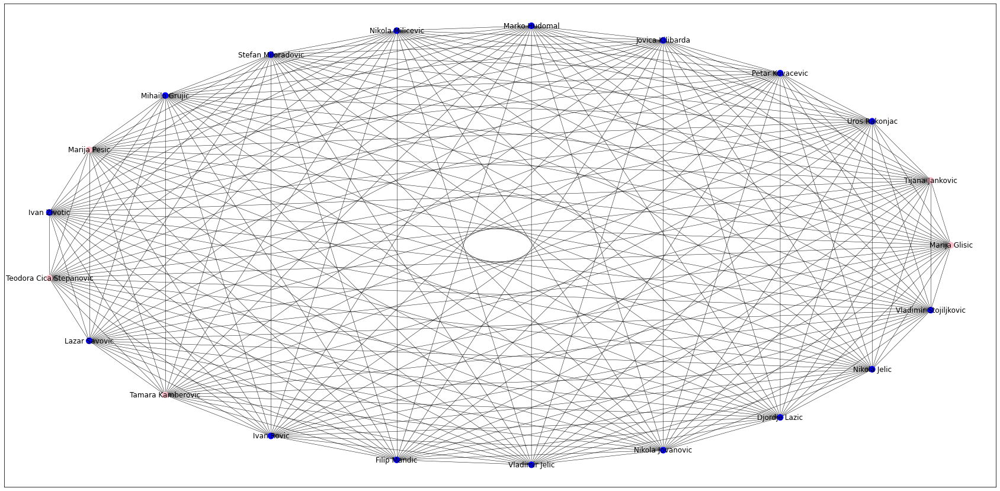

In [93]:
plt.figure(figsize = (30, 15))

nx.draw_networkx(maximal_clique, 
                 pos = nx.circular_layout(maximal_clique),
                 node_color = list(nx.get_node_attributes(maximal_clique, 'gender_color').values()),
                 node_size = 100,
                 labels = labels_clique, 
                 width = 0.5)

plt.show()

### k-core decomposition

A k-core is a maximal subgraph that contains nodes of degree k or more.
The core number of a node is the largest value k of a k-core containing that node. It is a measure of how sparse graph is.

In [94]:
core_dict = nx.core_number(G)
res = dict(Counter(core_dict.values()))

print('k-core number : number of nodes in network')
print('------------------------------------------')
for key in sorted(res):
    print('{} : {}'.format(key, res[key])) 

k-core number : number of nodes in network
------------------------------------------
0 : 18
1 : 15
2 : 11
3 : 17
4 : 6
5 : 10
6 : 5
7 : 12
8 : 4
9 : 8
10 : 19
11 : 11
12 : 18
13 : 20
14 : 61
15 : 28
16 : 4
17 : 2
18 : 24
19 : 3
20 : 5
21 : 2
22 : 1
24 : 29


In [95]:
def k_core_decompose(G):
    return np.array(list(nx.core_number(G).values()))

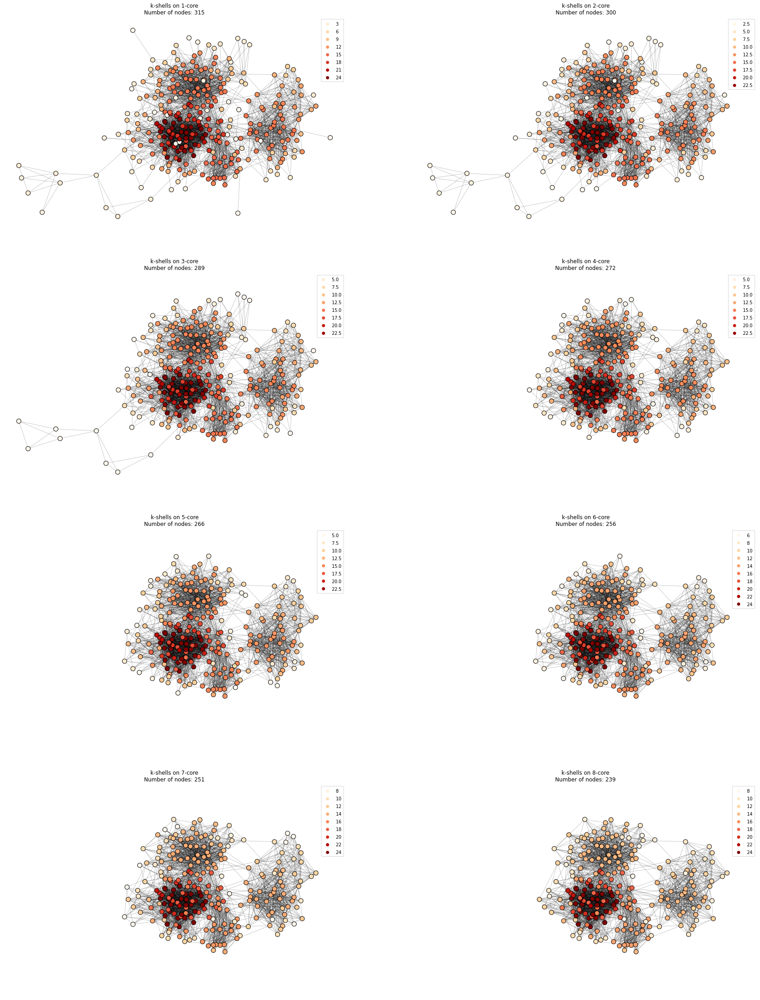

In [96]:
labels = k_core_decompose(G)
pos = nx.kamada_kawai_layout(G)

plt.figure(figsize = (15 * 2, 10 * 4))

x_max, y_max = np.array(list(pos.values())).max(axis = 0)
x_min, y_min = np.array(list(pos.values())).min(axis = 0)

for i in range(8):
    plt.subplot(4, 2, i + 1)
    subG = nx.k_core(G, i + 1)
    nodes = nx.draw_networkx_nodes(
        subG, 
        pos,
        cmap = plt.cm.OrRd,
        node_color = k_core_decompose(subG), 
        node_size = 100, 
        edgecolors = 'black'
    )
    nx.draw_networkx_edges(
        subG, 
        pos,
        alpha = 0.3,
        width = 0.7, 
        edge_color = 'black'
    )
    eps = (x_max - x_min) * 0.05
    plt.xlim(x_min - eps, x_max + eps)
    plt.ylim(y_min - eps, y_max + eps)
    plt.legend(*nodes.legend_elements())
    plt.axis('off')
    plt.title('k-shells on {}-core\nNumber of nodes: {}'.format(i + 1, len(subG.nodes)))
      

Although it is not obvious based on the previous visualizations (beacuse of many number of nodes in the network), we can see that number of nodes in graph is significantly decreasing after each of these iterations.  

### Community detection

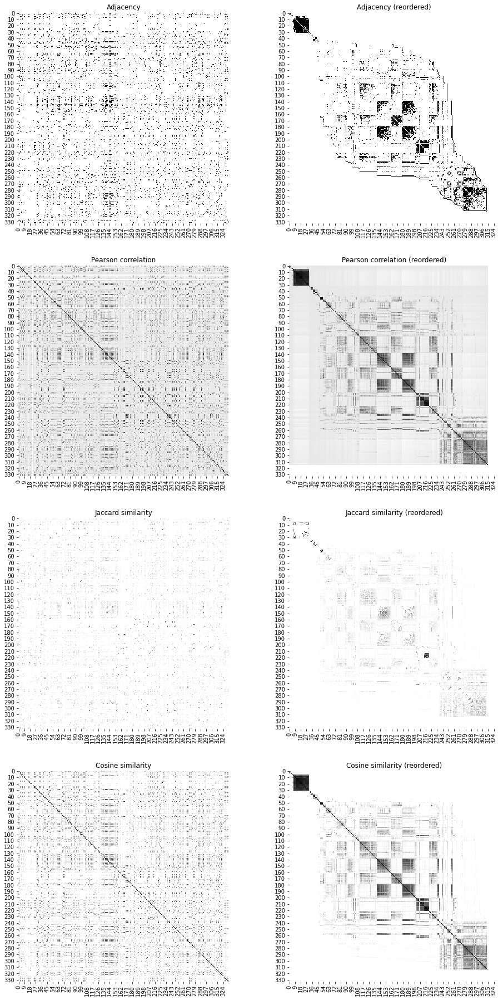

In [97]:
fig = plt.figure(figsize = (16, 16 * 2))

cases = [[1, A, plt.cm.Greys, 'Adjacency', range(333)],
         [2, A, plt.cm.Greys, 'Adjacency (reordered)', order],
         [3, corr, plt.cm.Greys, 'Pearson correlation', range(333)], 
         [4, corr, plt.cm.Greys, 'Pearson correlation (reordered)', order], 
         [5, J, plt.cm.Greys, 'Jaccard similarity', range(333)], 
         [6, J, plt.cm.Greys, 'Jaccard similarity (reordered)', order], 
         [7, cos, plt.cm.Greys, 'Cosine similarity', range(333)], 
         [8, cos, plt.cm.Greys, 'Cosine similarity (reordered)', order]]

for i, matrix, cmap, t, o in cases:
    plt.subplot(4, 2, i)
    hmap = sns.heatmap(
        matrix[np.ix_(o, o)],
        cmap = cmap,
        cbar = False,
        square = True)
    plt.title(t)

We used already calculated similarity matrices. Here we can see three large comunities. 

I did not print names of people in my network directly on the graph since I have many nodes in it, but I decided to explore more deeply these groups. 

Based on the size and similarities between nodes in each group, I can suppose that first square represents my friends from camp in Russia, the biggest square probably represents people I met during primary, high school and undergraduate studies and the last square is probably nodes of my friends from the period when I was swimming.

In [98]:
labs = nx.get_node_attributes(G, 'name_and_surname')
new_labs = np.array([labs.get(i) for i in G.nodes])

print('First group: ')
print('-----------------------')
for i in range(6, 33):
  print(new_labs[order][i])

print('')
print('-----------------------')
print('')

print('Second group: ')
print('-----------------------')
for i in range(80, 220):
  print(new_labs[order][i])

print('')
print('-----------------------')
print('')

print('Third group: ')
print('-----------------------')
for i in range(280, 315):
  print(new_labs[order][i])

First group: 
-----------------------
Ekaterina Alytbregina
Egor Nevezhin
Haff MSili
Ines Alibou
Steeven Huglo
Julia Kostinikova
Alexandra Apitsina
Roman Maliushkin
Alyona Tarasova
Leire Segurola
Alena Mezentseva
Anna Ferrater Roca
Edoardo von Morgen
Ilya Bokatiy
Lucia Kajanova
Mirka Cavojska
Nastya Volkova
Andrej Vibe
Yuliya Usikova
Sara Giacopello
Pietro Gandossi
Olga Rybkina
Rut Campos Jimenez
Ma MoCer
Rebecca Antinori
Filip Waszczuk
Sophie Kropiwnicki

-----------------------

Second group: 
-----------------------
Isidora Rackov
Aleksa Marusic
Katarina Stekic
Bojana Bujakovic
Ana Merkle
Aleksandra Pavlovic
Nemanja Dacic
Ana Vulic
Tina Lovcevic
Natasa Martinovic
Milica Jelic
Ana Vulic
Nevena Vujetic
Marija Suljagic
Branka Kujovic Rankov
Valentina Balint
Milena Zdravkovic
Hana Zekovic
Ana Di
Dusica Ristic
Emir Custovic
Marija Seslija
Jovana Spasenovic
Aida
Jovan Nicic
Aleksandar Djukic
Kire Nedelkovski
Killmister Markovic
Jana Boskovic
Jelena Krulj
Andjelija Lazov
Anisia Jovanovski


The first group - the darkest square indeed represents my friends from the Ecological camp in Russia I attended in 2016, as I supposed. We all connected on Facebook back then.

The biggest square (full of many smaller squares) represents my friends during education. Many people I know from the primary school attended the same high school. Also, most of the people from my high school were studying at the same place, so we had a chance to meet each other friends / study buddies even if were not studying in the same faculty.

The last square represents my friends from swimming. Among those people are not just my teammates, but also many swimmers from other clubs across Serbia and Bosnia and Hercegovina.

In [99]:
def edge_betweenness(G, n):
    
    Gcopy = G.copy()
    curr_cc_count = nx.number_connected_components(Gcopy)
    result = []

    while curr_cc_count <= n:
        edge_btw = nx.edge_betweenness_centrality(Gcopy)
        cut_edge = sorted(edge_btw.keys(), key=lambda x : edge_btw[x])[-1]
        Gcopy.remove_edge(*cut_edge)
        if (nx.number_connected_components(Gcopy) > curr_cc_count):
            iter_result = np.zeros((Gcopy.number_of_nodes()))
            for idx, cc in enumerate(nx.connected_components(Gcopy)):
                iter_result[np.isin(G.nodes, list(cc))] = idx
            result.append(iter_result)
            curr_cc_count += 1
    
    return np.array(result)

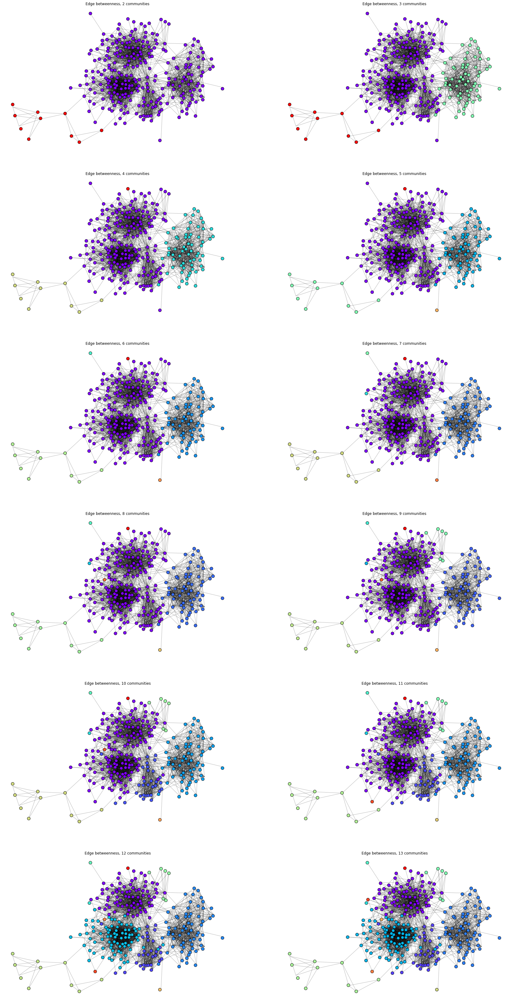

In [100]:
fig = plt.figure(figsize = (15 * 2, 10 * 6))
colors = edge_betweenness(biggest_cc, 12)

for i in range(colors.shape[0]):
    plt.subplot(6, 2, i + 1)
    nx.draw_networkx_nodes(
        biggest_cc, 
        pos = nx.kamada_kawai_layout(biggest_cc),
        cmap = plt.cm.rainbow,
        node_color = colors[i], 
        node_size = 100, 
        edgecolors = 'black'
    )
    nx.draw_networkx_edges(biggest_cc, pos, alpha = 0.3)
    plt.title('Edge betweenness, {} communities'.format(i + 2))
    plt.axis('off')


In [101]:
 def edge_betw_modularity(G, n):

    res = []
    comm_gen = nx.algorithms.community.girvan_newman(G)
    
    for i in range(n):
      part = next(comm_gen)
      res.append(nx.algorithms.community.modularity(G, part))
    
    return np.array(res)   

In [102]:
n_iterations = 20
modularity = edge_betw_modularity(biggest_cc, n_iterations)

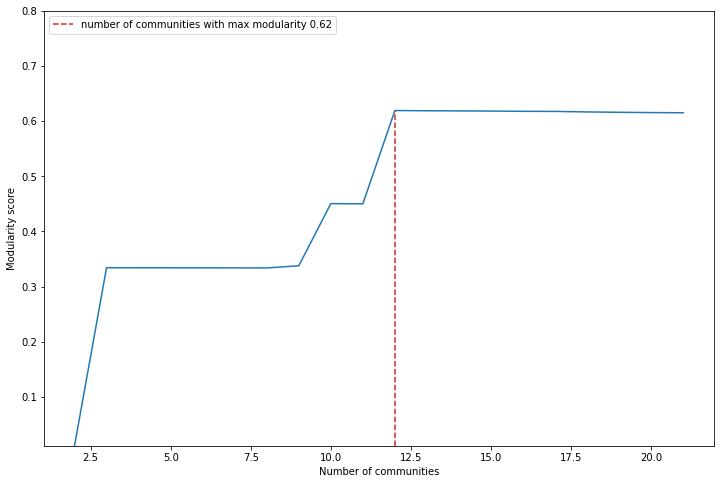

In [103]:
plt.figure(figsize = (12, 8))
plt.plot(np.arange(n_iterations) + 2, modularity)
best_n = np.argmax(modularity) + 2
label = 'number of communities with max modularity {:.2f}'.format(max(modularity))
plt.plot(
    [best_n, best_n], [min(modularity), max(modularity)], 
    'k--', c = 'tab:red', 
    label = label
)
plt.ylabel('Modularity score')
plt.xlabel('Number of communities')
plt.legend(loc='upper left')
plt.ylim((modularity.min(), 0.8))
plt.show()

From the graph, we can see that the number of communites based on the max modularity should be 12.

#### Agglomerative clustering

In [104]:
def simrank_distance(G):
    N = nx.simrank_similarity_numpy(G).shape[0]
    return np.around(np.subtract(np.ones(N), nx.simrank_similarity_numpy(G)), 10)

In [105]:
distance = simrank_distance(biggest_cc)

In [106]:
def agglomerative_clustering(distance, max_distance):
    
    clustering = AgglomerativeClustering(n_clusters = None, affinity = 'precomputed', linkage = 'complete', distance_threshold = max_distance).fit(distance)
    
    return np.array(clustering.labels_)

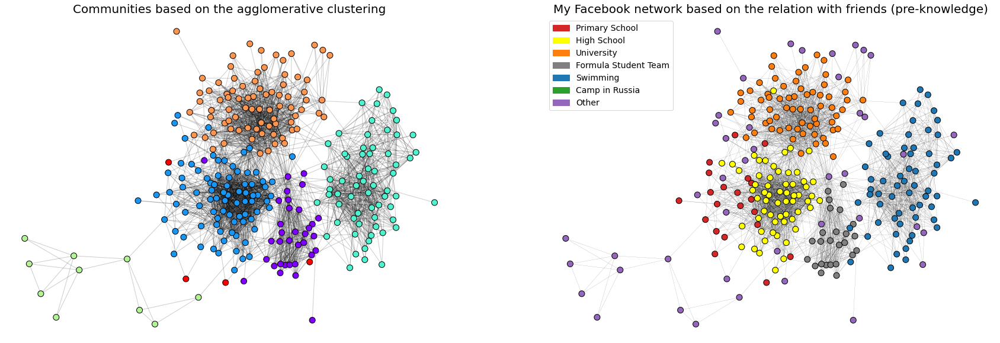

In [107]:
labels = agglomerative_clustering(distance, 0.97)
pos = nx.kamada_kawai_layout(biggest_cc)

plt.figure(figsize = (15 * 2, 10))
plt.subplot(1, 2, 1)
nx.draw_networkx_nodes(biggest_cc, 
                       pos,
                       cmap = plt.cm.rainbow,
                       node_color = labels, 
                       node_size = 100, 
                       linewidths = 1, 
                       edgecolors = 'black')
nx.draw_networkx_edges(biggest_cc,
                       pos,
                       alpha = 0.2,
                       edge_color = 'black')
plt.title('Communities based on the agglomerative clustering', fontsize = 20)
plt.axis('off')

plt.subplot(1, 2, 2)
nx.draw_networkx(biggest_cc,
                 pos = nx.kamada_kawai_layout(biggest_cc), 
                 width = 0.1,
                 node_size = 100,
                 node_color = list(nx.get_node_attributes(biggest_cc, 'relation_color').values()),
                 edgecolors = 'black',
                 with_labels = False)

red_patch = mpatches.Patch(color = 'tab:red', label = 'Primary School')
yellow_patch = mpatches.Patch(color = 'yellow', label = 'High School')
orange_patch = mpatches.Patch(color = 'tab:orange', label = 'University')
gray_patch = mpatches.Patch(color = 'gray', label = 'Formula Student Team')
blue_patch = mpatches.Patch(color = 'tab:blue', label = 'Swimming')
green_patch = mpatches.Patch(color = 'tab:green', label = 'Camp in Russia')
purple_patch = mpatches.Patch(color = 'tab:purple', label = 'Other')

plt.title('My Facebook network based on the relation with friends (pre-knowledge)', fontsize = 20)
plt.legend(handles = [red_patch, yellow_patch, orange_patch, gray_patch, blue_patch, green_patch, purple_patch], loc = 'upper left', fontsize = 14)
plt.axis('off')

plt.show()

Thanks to the node attribute 'relation' which is based on the pre-knowledge of the source of my connection with other people in the network, we can conclude that results we got using agglomerative clustering quite accurately represent the real situation.